# Baseline survey cadence evolution: v3.5

In [1]:
# import necessary and useful packages
import os
import numpy as np
import matplotlib.pyplot as plt
import colorcet
import cycler
import pandas as pd
import rubin_sim.maf as maf

This notebook explores summary metric comparison across different simulations, primarily in the comparison of these metrics across the evolution of the baseline survey strategy. 

Jump to comparison of metrics targeting: 
* [SCOC overview](#SCOC)
* [Science Requirements Document](#SRD)
* [DESC WFD coverage](#DESCWFD)
* [Transient and Variable Stars](#TVS)
* [Solar System Objects](#SSO)
* [Active Galactic Nuclei](#AGN)
* [Galaxies](#Galaxies)
* [Strong Lensing](#StrongLensing)
* [Stars](#Stars)
* [Milky Way and Local Volume](#MWLV)

## Get background information about summary statistics

Read the information about the metric sets in this version of the sims outputs. The metric_sets defines groups of summary statistics that have been identified as likely relevant for comparing simulations for particular science purposes. 

In [63]:
metric_sets = maf.get_metric_subsets()
msets = list(metric_sets.groupby('metric subset').first().index)
[m for m in msets if 'SSO' in m]

['SSO N Objs',
 'SSO discovery',
 'SSO discovery options',
 'SSO fraction 3 bands',
 'SSO fraction 4 bands',
 'SSO fraction 5 bands',
 'SSO fraction 6 bands',
 'SSO lightcurve inversion']

In [78]:
nsummaries = maf.get_metric_summaries(summary_source='summary_v3.5.h5')
print(f"This summary h5 file contains information on {len(nsummaries.index)} simulations.")

This summary h5 file contains information on 34 simulations.


In [79]:
# I'm going to pull in v3.4 - but I do need to use this for the solar system metrics in previous baselines
osummaries = maf.get_metric_summaries(summary_source='summary_v3.4.h5')
print(f"This summary h5 file contains information on {len(osummaries.index)} simulations.")
#osummaries = osummaries.drop([r for r in nsummaries.index if r in osummaries.index])
#print(f"This summary h5 file now contains information on {len(osummaries.index)} simulations.")

This summary h5 file contains information on 265 simulations.


In [80]:
#summaries = pd.concat([nsummaries, osummaries])
summaries = nsummaries 
ssmetrics = list(metric_sets.loc[[m for m in msets if 'SSO' in m]]['metric'].values) + \
    [m for m in summaries if 'Vatira' in m and 'quad' in m and 'CumulativeCompleteness' in m and 'Time' not in m and '20.0' in m]
ssmetrics = list(set(ssmetrics))
obaselines = ['retro_baseline_v2.0_10yrs',  'baseline_v2.0_10yrs',
                 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs',
                 'baseline_v3.0_10yrs',  'baseline_v3.2_10yrs', 'baseline_v3.3_10yrs',]
# Patch sso_old into new summaries
summaries.loc[obaselines, ssmetrics] = osummaries.loc[obaselines, ssmetrics]
print(len(summaries))

34


Identify some subsets of runs that belong in common families, such as runs that were created for deep drilling field exploration or galactic plane coverage exploration. 

In [81]:
m5_SRD_design = {'u': 23.90, 'g': 25.00, 'r': 24.70, 'i': 24.00, 'z': 23.30, 'y': 22.10}
m5_SRD_minimum = {'u': 23.40, 'g':24.60, 'r': 24.30, 'i': 23.60, 'z': 22.90, 'y': 21.70}

# Weather variations on baseline strategy
weather_runs = [r for r in summaries.index if 'weather' in r]
offsets = [int(w.split('dso')[-1].split('v3')[0]) for w in weather_runs]
idx = np.argsort(offsets)
weather_runs = [weather_runs[i] for i in idx]
weather_runs
print("weather runs", len(weather_runs))

# DDF variations
ddf = [r for r in summaries.index if 'ddf' in r]
ddf

# Rolling cadence variations
roll = [r for r in summaries.index if 'roll' in r and 'mw' not in r]
roll

# SMWLV variations
mw = [r for r in summaries.index if 'mw' in r or 'lmc' in r or 'reweight' in r or 'no_high_blob' in r]
mw

# u band variations
uband = [r for r in summaries.index if \
        # 'u_exp' in r or \
         'internal' in r]
uband_dict = {'u_exp_25_v3.3_10yrs': 'u 25s',
              'u_exp_30_v3.3_10yrs': 'u 30s',
              'u_exp_othershort_38_other29_v3.3_10yrs': 'u 38s +',
              'u_exp_40_v3.3_10yrs': 'u 40s',
               'u_exp_50_v3.3_10yrs': 'u 50s',
                'u_exp_60_v3.3_10yrs': 'u 60s',
             'baseline_v3.2_10yrs': 'v3.2',
             'baseline_v3.3_10yrs': 'v3.3'}
uband_shortname = [f"u {r.split('expt')[-1].split('_')[0]}s {r.split('nscale')[-1].split('v3.4')[0]}" for r in uband]
uband +=  ['u_exp_othershort_38_other29_v3.3_10yrs', 'baseline_v3.2_10yrs', 'baseline_v3.3_10yrs']
uband_shortname += ['u 38s 1*', 'v3.2', 'v3.3']
uband_dict = {}
for u, us in zip(uband, uband_shortname):
    uband_dict[u] = us

# Baseline sims, and put them in order of evolution
baselines = [r for r in summaries.index if 'baseline' in r]
versions = [float(r.split('_v')[-1].split('_10yrs')[0]) for r in baselines]
idx = np.argsort(versions)
baselines = [baselines[i] for i in idx]
# Rearrange to put retro first in list
tmp = baselines[0]
baselines[0] = baselines[1]
baselines[1] = tmp
# drop m2 baseline
baselines = [r for r in baselines if 'm2' not in r]
baselines += ['early_draft_v3.5_10yrs']

baseline_run = 'baseline_v3.3_10yrs'

baseline_dict = {'retro_baseline_v2.0_10yrs': 'v1.x', 
                 'baseline_v2.0_10yrs':'v2.0', 
                 'baseline_v2.1_10yrs':'v2.1',
                 'baseline_v2.2_10yrs':'v2.2',
                 'baseline_v3.0_10yrs':'v3.0',
                 'baseline_v3.2_10yrs':'v3.2',
                'baseline_v3.3_10yrs':'v3.3',
                'baseline_v3.4_10yrs': 'v3.4',
                'baseline_v3.5_10yrs': 'v3.5',
                }
baselines = list(baseline_dict.keys())
print(baselines)


newbaselines_dict = {'baseline_v3.5_10yrs': "baseline v3.5",
                    'too_v3.5_10yrs' : "baseline + too",
                   'four_cycle_v3.5_10yrs': "four cycles",
                    'one_snap_v3.5_10yrs' : "single snap",
                   'telescope_jerk_v3.5_10yrs': "baseline + jerk",
                    'telescope_jerk_downtimes_v3.5_10yrs': "jerk + downtime"
                    }
newbaselines = list(newbaselines_dict.keys())

outdir = 'tmp_fig'
try:
    os.mkdir(outdir)
except:
    pass

weather runs 16
['retro_baseline_v2.0_10yrs', 'baseline_v2.0_10yrs', 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs', 'baseline_v3.0_10yrs', 'baseline_v3.2_10yrs', 'baseline_v3.3_10yrs', 'baseline_v3.4_10yrs', 'baseline_v3.5_10yrs']


We can derive approximate uncertainties for some of our relevant metrics by looking at their variation across the different 'weather' instances of the baseline strategy.
This isn't necessarily appropriate for all metrics, but it does give a useful indications.

In [82]:
dev = np.std(summaries.loc[weather_runs], axis=0)
hilo = np.abs(summaries.loc[weather_runs].max() - summaries.loc[weather_runs].min())

nvis = [m for m in summaries if "Nvisits" in m and "UniSlicer" in m and 'All' in m]
print(f"example: Total NVisits (in millions) std dev {dev[nvis].iloc[0]/1e6: .2f}, range is {hilo[nvis].iloc[0]/1e6 :.2f}, baseline {summaries.loc[baseline_run, nvis].iloc[0]/1e6 :.2f}")

example: Total NVisits (in millions) std dev  0.05, range is 0.18, baseline 2.13


In [83]:
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

filter_colors = {"u": "cyan", "g": "g", "r": "orange", "i": "r", "z": "m", "y": "b"}

filter_rgb_map = {
    "u": (74 / 256, 125 / 256, 179 / 256),
    "g": (104 / 256, 173 / 256, 87 / 256),
    "r": (238 / 256, 134 / 256, 50 / 256),
    "i": (232 / 256, 135 / 256, 189 / 256),
    "z": (209 / 256, 53 / 256, 43 / 256),
    "y": (142 / 256, 82 / 256, 159 / 256),
}

filter_color_map = ListedColormap(list(filter_rgb_map.values()))

def plot_metric(summaries, uncertainties, runs, msub, fig=None):
    if fig is None:
        fig, ax = plt.subplots() 
    else:
        ax = fig.gca()
    if isinstance(msub, list):
        for m in msub:
            ax.errorbar(runs, summaries[m], yerr=uncertainties[m],
                        marker='.', label=m.replace("Identity ", ""))
    else:
        for i, m in msub.iterrows():
            if len(m['style']) > 1:
                color = m['style'][0]
                linestyle=m['style'][1]
            else:
                color = None
                linestyle = m['style'][0]
            ax.errorbar(runs, summaries[m['metric']], yerr=uncertainties[m['metric']], 
                        color=color, linestyle=linestyle, marker='.', label=m['short_name'])
    plt.legend(loc=(1.01, 0.35), fontsize='x-large')
    ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
    return fig, ax

## Major updates v3.5

The v3.5 simulations represent early versions of the phase 3 recommendations. 
The changes include: 
* uniform rolling (pauses in rolling cadence for year 4 and year 7 data releases)
* exposure time changes in u band (38s) and other bandpasses reduced to 29 seconds 
* readout time changed to 2.4 seconds
* bluer filter balance in LMC/SMC
* updated footprint in galactic plane, including directing visits toward the Roman deep field
* ToOs added in some versions of the baseline
* DDF scheduling updated, leading to more observations per DDF in year one 
* bugfix to reduce number of non-paired visits per night, bugfix so that morning twilight neo microsurvey uses r band ..

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying table None with no constraint for columns ['observationStartMJD', 'rotSkyPos', 'fieldDec', 'fieldRA'].
Found 2138598 visits
Running:  ['nvisits']
Processing slices: 100%|███████████████| 49152/49152 [00:26<00:00, 1861.46it/s]
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.


{'SkyMap': <Figure size 640x480 with 2 Axes>}

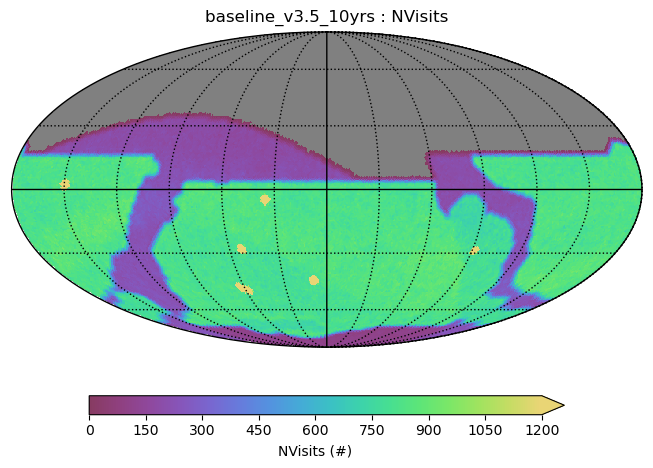

In [84]:
opsdb = 'baseline_v3.5_10yrs.db'
run_name = os.path.split(opsdb)[-1].replace('.db', '')

metric = maf.CountMetric('observationStartMJD', metric_name='NVisits')
slicer = maf.HealpixSlicer(nside=64)
constraint = None
plot_dict = {'color_min': 0, 'color_max': 1200, 'extend': 'max'}
plot_funcs = [maf.HealpixSkyMap(),]
bundle = maf.MetricBundle(metric, slicer, constraint, run_name=run_name, 
                          plot_dict=plot_dict, plot_funcs=plot_funcs)
g = maf.MetricBundleGroup({'nvisits': bundle}, opsdb, verbose=True)
g.run_all()

bundle.plot()

In [85]:
rdict = {}
for k in baseline_dict:
    rdict[k] = baseline_dict[k]
for k in newbaselines_dict:
    rdict[k] = newbaselines_dict[k]
rdict

{'retro_baseline_v2.0_10yrs': 'v1.x',
 'baseline_v2.0_10yrs': 'v2.0',
 'baseline_v2.1_10yrs': 'v2.1',
 'baseline_v2.2_10yrs': 'v2.2',
 'baseline_v3.0_10yrs': 'v3.0',
 'baseline_v3.2_10yrs': 'v3.2',
 'baseline_v3.3_10yrs': 'v3.3',
 'baseline_v3.4_10yrs': 'v3.4',
 'baseline_v3.5_10yrs': 'baseline v3.5',
 'too_v3.5_10yrs': 'baseline + too',
 'four_cycle_v3.5_10yrs': 'four cycles',
 'one_snap_v3.5_10yrs': 'single snap',
 'telescope_jerk_v3.5_10yrs': 'baseline + jerk',
 'telescope_jerk_downtimes_v3.5_10yrs': 'jerk + downtime'}

In [86]:
runs = list(rdict.keys())
baseline = 'baseline_v3.5_10yrs'
summaries.loc[runs, [c for c in summaries.columns if "Median Median" in c and "Healpix" in c and 'all bands' in c]]

metric,Median Median HA All sky all bands HealpixSlicer,Median Median HA WFD all bands HealpixSubsetSlicer,Median Median Inter-Night Gap All sky all bands HealpixSlicer,Median Median Inter-Night Gap WFD all bands HealpixSubsetSlicer,Median Median Season Length All sky all bands HealpixSlicer,Median Median Season Length WFD all bands HealpixSubsetSlicer,Median Median airmass All sky all bands HealpixSlicer,Median Median airmass WFD all bands HealpixSubsetSlicer,Median Median airmass Yr 1 all bands HealpixSlicer,Median Median fiveSigmaDepth All sky all bands HealpixSlicer,...,Median Median saturation_mag WFD all bands HealpixSubsetSlicer,Median Median seeingEff All sky all bands HealpixSlicer,Median Median seeingEff WFD all bands HealpixSubsetSlicer,Median Median seeingEff Yr 1 all bands HealpixSlicer,Median Median seeingGeom Yr 1 all bands HealpixSlicer,Median Median skyBrightness All sky all bands HealpixSlicer,Median Median skyBrightness WFD all bands HealpixSubsetSlicer,Median Median skyBrightness Yr 1 all bands HealpixSlicer,Median Median solarElong All sky all bands HealpixSlicer,Median Median solarElong WFD all bands HealpixSubsetSlicer
run,,,,,,,,,,,,,,,,,,,,,
retro_baseline_v2.0_10yrs,0.282853,0.352916,3.936797,3.875663,166.621692,177.100136,1.110656,1.096721,1.113897,23.303354,...,14.277353,0.999869,0.981123,0.925874,0.813069,20.002306,20.005349,19.585198,136.947217,136.292763
baseline_v2.0_10yrs,0.698406,1.036287,3.447742,3.006606,163.662998,173.650455,1.152475,1.143041,1.138379,23.263152,...,14.201887,1.031535,1.009362,0.938122,0.823136,19.899192,19.826302,19.913651,134.886775,133.014680
baseline_v2.1_10yrs,0.711177,0.996147,3.876155,3.031920,161.737749,170.739371,1.147935,1.138601,1.132786,23.284172,...,14.224393,1.032526,1.007333,0.931730,0.817882,19.927946,19.868777,19.972329,135.274265,133.573157
baseline_v2.2_10yrs,0.696104,0.928847,3.018810,2.983384,165.737883,174.251105,1.145620,1.135717,1.129174,23.322420,...,14.235207,1.027467,1.006583,0.932440,0.818466,19.897935,19.847136,19.790616,135.201114,133.830130
baseline_v3.0_10yrs,0.939916,1.152423,2.986727,2.955405,170.675421,177.670712,1.166942,1.152524,1.142486,23.234677,...,14.176052,1.044306,1.022915,0.944211,0.828142,19.773911,19.750051,19.764336,134.285927,133.577936
baseline_v3.2_10yrs,0.716050,0.814533,2.964570,2.915962,169.614292,175.671014,1.154769,1.139218,1.144991,23.230474,...,14.167067,1.040119,1.021816,0.953618,0.835874,19.696515,19.670427,19.558505,131.545159,131.430394
baseline_v3.3_10yrs,0.733287,0.861659,2.953835,2.890844,167.637680,174.622052,1.153186,1.138377,1.141549,23.335604,...,14.166160,1.043420,1.023042,0.961474,0.842332,19.741698,19.705163,19.797151,131.814414,131.477648
baseline_v3.4_10yrs,0.849564,0.990580,2.960373,2.894555,165.688742,172.309534,1.165929,1.149765,1.152441,23.331992,...,14.156571,1.049812,1.028694,0.962164,0.842898,19.804831,19.777743,19.846690,132.371367,132.141501
baseline_v3.5_10yrs,0.672539,0.918028,3.017838,2.978640,165.671021,171.705740,1.169486,1.158514,1.160986,23.356619,...,14.123278,1.052191,1.033286,0.963057,0.843633,19.813911,19.750050,19.801278,131.551141,131.283418


metric,Median CoaddM5 WFD u band HealpixSubsetSlicer,Median CoaddM5 WFD g band HealpixSubsetSlicer,Median CoaddM5 WFD r band HealpixSubsetSlicer,Median CoaddM5 WFD i band HealpixSubsetSlicer,Median CoaddM5 WFD z band HealpixSubsetSlicer,Median CoaddM5 WFD y band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD u band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD g band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD r band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD i band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD z band HealpixSubsetSlicer,Mean Median fiveSigmaDepth WFD y band HealpixSubsetSlicer,Median NVisits WFD u band HealpixSubsetSlicer,Median NVisits WFD g band HealpixSubsetSlicer,Median NVisits WFD r band HealpixSubsetSlicer,Median NVisits WFD i band HealpixSubsetSlicer,Median NVisits WFD z band HealpixSubsetSlicer,Median NVisits WFD y band HealpixSubsetSlicer
run,,,,,,,,,,,,,,,,,,
retro_baseline_v2.0_10yrs,25.722777,26.874548,26.886497,26.339785,25.638396,24.851604,23.500700,24.471584,24.012972,23.429477,22.799612,22.007059,53.0,76.0,183.0,184.0,164.0,173.0
baseline_v2.0_10yrs,25.878766,26.798613,26.815288,26.276604,25.569242,24.808334,23.625599,24.415908,23.937625,23.345464,22.707114,21.959046,56.0,73.0,183.0,186.0,166.0,171.0
baseline_v2.1_10yrs,25.806171,26.814225,26.855239,26.316998,25.551760,24.767587,23.559503,24.422062,23.967529,23.393912,22.705425,21.927466,56.0,71.0,185.0,187.0,164.0,170.0
baseline_v2.2_10yrs,25.781300,26.821731,26.901136,26.356917,25.641411,24.825393,23.592806,24.439859,24.022646,23.435981,22.804101,21.983962,50.0,70.0,183.0,187.0,165.0,170.0
baseline_v3.0_10yrs,25.727568,26.765381,26.880835,26.324293,25.596042,24.801172,23.578461,24.401041,23.977689,23.383454,22.777027,21.976273,46.0,67.0,184.0,189.0,159.0,164.0
baseline_v3.2_10yrs,25.682341,26.764206,26.875228,26.361739,25.650659,24.809495,23.559476,24.383636,23.958747,23.418888,22.794842,21.972839,45.0,68.0,184.0,192.0,169.0,168.0
baseline_v3.3_10yrs,25.394998,26.867534,26.998017,26.518655,25.818944,24.851449,23.192448,24.464550,24.078710,23.577294,22.971874,22.025155,53.0,70.0,185.0,191.0,168.0,165.0
baseline_v3.4_10yrs,25.386334,26.873695,27.003855,26.514849,25.818886,24.848948,23.184516,24.461378,24.090276,23.577979,22.969092,22.019467,53.0,70.0,186.0,192.0,169.0,166.0
baseline_v3.5_10yrs,25.635897,26.855768,26.952603,26.451301,25.795098,24.823790,23.385435,24.455803,24.049714,23.522375,22.948868,22.006472,57.0,69.0,184.0,186.0,166.0,162.0


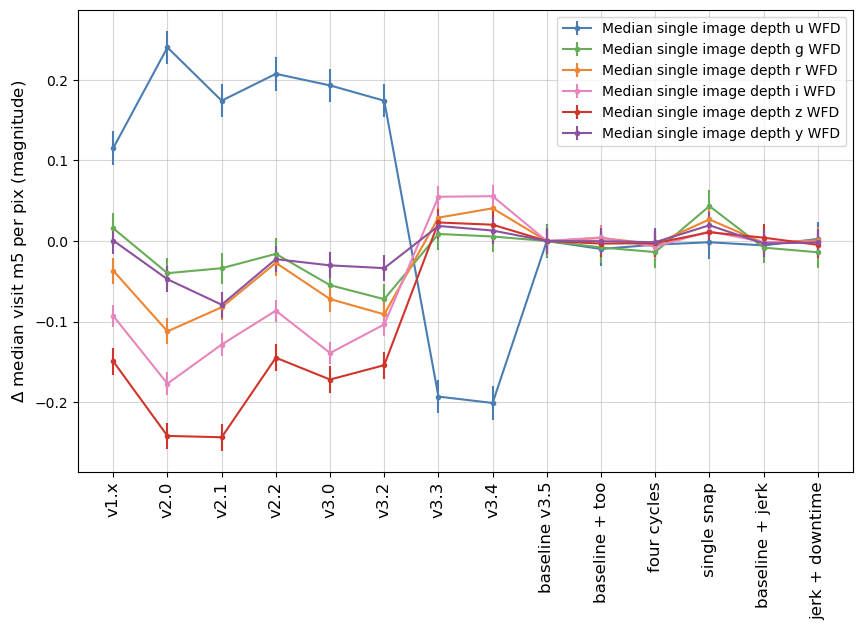

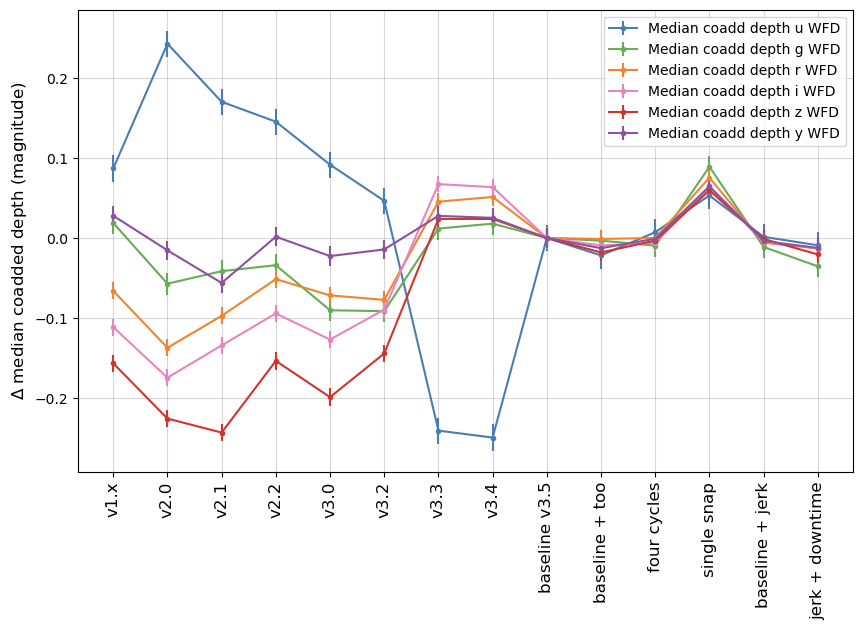

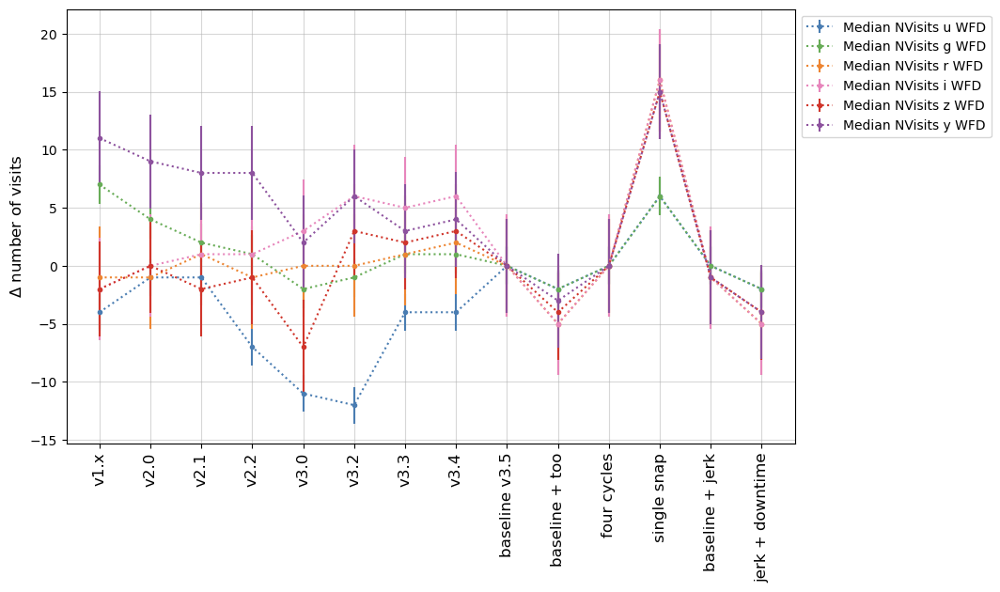

In [87]:
# Check in on the depths and number of visits in each bandpass
k = 'WFD Depths'

msub = metric_sets.loc[k].query('metric.str.contains("Mean Median")')
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']] - summaries.loc[baseline, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub,
                                 cmap=filter_color_map,
                                 sep_plots=False)
ax.set_ylabel("$\Delta$ median visit m5 per pix (magnitude)", fontsize='large')
y1, y2 = plt.ylim()
fig.savefig(os.path.join(outdir, 'visit_m5_per_pix' + '.png'), format='png')


msub = metric_sets.loc[k].query('metric.str.contains("Coadd")')
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']] - summaries.loc[baseline, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub,
                                 cmap=filter_color_map,
                                 sep_plots=False)
ax.set_ylabel("$\Delta$ median coadded depth (magnitude)", fontsize='large')
y1, y2 = plt.ylim()
fig.savefig(os.path.join(outdir, 'coadd_m5_per_pix' + '.png'), format='png')

msub = metric_sets.loc[k].query('metric.str.contains("NVisits")')
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']] - summaries.loc[baseline, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub,
                                 cmap=filter_color_map,
                                 sep_plots=False)
ax.set_ylabel("$\Delta$ number of visits", fontsize='large')
y1, y2 = plt.ylim()
fig.savefig(os.path.join(outdir, 'nvisit_per_pix'+ '.png'), format='png')

#print(dev[metric_sets.loc[k]['metric']])
summaries.loc[runs, metric_sets.loc[k]['metric']] #- summaries.loc[baseline, metric_sets.loc[k]['metric']]

In [88]:
cols = [m for m in summaries if "Teff All sky all bands" in m and "UniSlicer" in m and "Normalized" not in m]
cols

d = summaries.loc[runs, cols]/summaries.loc[baseline, cols]
d = d.rename(columns={'Identity Total Teff All sky all bands UniSlicer': "Teff Total"})
d.round(2)

metric,Teff Total
run,
retro_baseline_v2.0_10yrs,0.87
baseline_v2.0_10yrs,0.81
baseline_v2.1_10yrs,0.81
baseline_v2.2_10yrs,0.87
baseline_v3.0_10yrs,0.83
baseline_v3.2_10yrs,0.84
baseline_v3.3_10yrs,1.02
baseline_v3.4_10yrs,1.02
baseline_v3.5_10yrs,1.00


And finally, let's have a look at those depths compared to SRD design and minimum goals, to evaluate how these changes are redistributing depth (or, in a sense, time) among bandpasses.

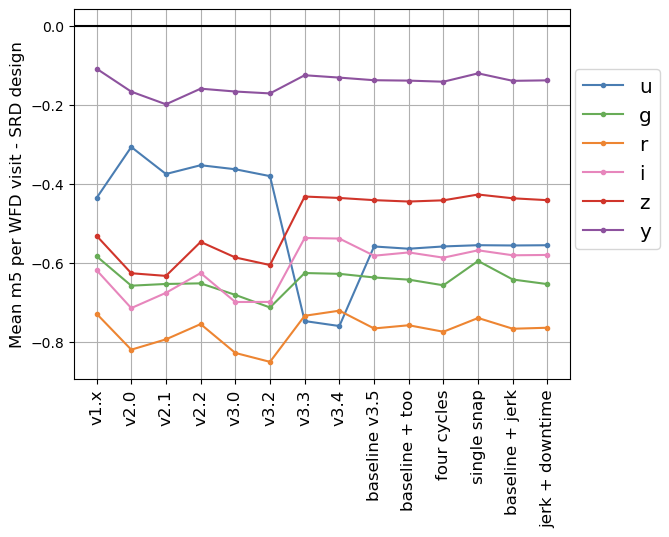

In [89]:
cols = [m for m in summaries if "fiveSigmaDepth" in m and 'band' in m and "UniSlicer" in m
             and ("Mean" in m) and "WFD" in m and "Yr 1" not in m and 'all' not in m]
cols = [f'Identity Mean fiveSigmaDepth WFD {f} band UniSlicer' for f in 'ugrizy']
newcols = [f'Mean m5 WFD {f} band per image' for f in 'ugrizy']
visitdepth_cols = cols

mset = maf.create_metric_subset('VisitDepths', metrics=cols, short_name=newcols, invert=False, mag=True) 

fig, ax = plt.subplots() 

for f, col in zip(['u', 'g', 'r', 'i', 'z', 'y'], cols):
    ax.plot(list(rdict.values()), summaries.loc[runs, col] - m5_SRD_design[f], 
                color=filter_rgb_map[f], marker='.', linestyle='-', label=f)
    #ax.axhline(m5_SRD_design[f], color=filter_colors[f], linestyle=':', linewidth=3)

ax.axhline(0, color='k', linestyle='-')
ax.set_ylabel(f"Mean m5 per WFD visit - SRD design", fontsize='large')
plt.legend(loc=(1.01, 0.35), fontsize='x-large')
ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
ax.grid()
fig.savefig(os.path.join(outdir, 'm5_per_visit'+ '.png'), format='png')

In [90]:
## WFD coadd vs. exgal coadd depths 

k = 'WFD Depths'

msub = metric_sets.loc[k].query('metric.str.contains("Coadd")')
q1 = summaries.loc[runs, msub['metric']]
names = {}
for m in msub['metric']:
    names[m] = m.split(" band")[0][-1:]
q1.rename(columns=names, inplace=True)

metrics = [f"Median Exgal_CoaddM5 WFD {f} band HealpixSubsetSlicer" for f in 'ugrizy']
q2 = summaries.loc[runs, metrics]
names = {}
for m in metrics:
    names[m] = m.split(" band")[0][-1:]
q2.rename(columns=names, inplace=True)


summaries.loc[runs, metrics].round(2)#.T.to_dict()

metric,Median Exgal_CoaddM5 WFD u band HealpixSubsetSlicer,Median Exgal_CoaddM5 WFD g band HealpixSubsetSlicer,Median Exgal_CoaddM5 WFD r band HealpixSubsetSlicer,Median Exgal_CoaddM5 WFD i band HealpixSubsetSlicer,Median Exgal_CoaddM5 WFD z band HealpixSubsetSlicer,Median Exgal_CoaddM5 WFD y band HealpixSubsetSlicer
run,,,,,,
retro_baseline_v2.0_10yrs,25.44,26.65,26.72,26.22,25.54,24.77
baseline_v2.0_10yrs,25.61,26.57,26.65,26.16,25.47,24.73
baseline_v2.1_10yrs,25.52,26.57,26.69,26.20,25.45,24.69
baseline_v2.2_10yrs,25.49,26.58,26.74,26.24,25.54,24.74
baseline_v3.0_10yrs,25.44,26.52,26.70,26.19,25.49,24.72
baseline_v3.2_10yrs,25.40,26.52,26.69,26.22,25.54,24.72
baseline_v3.3_10yrs,25.12,26.61,26.81,26.37,25.71,24.76
baseline_v3.4_10yrs,25.12,26.62,26.82,26.38,25.71,24.76
baseline_v3.5_10yrs,25.36,26.60,26.78,26.32,25.68,24.74


## Evaluate metrics

Let's evaluate some metric results across these baseline surveys, starting with a very high level overview. 

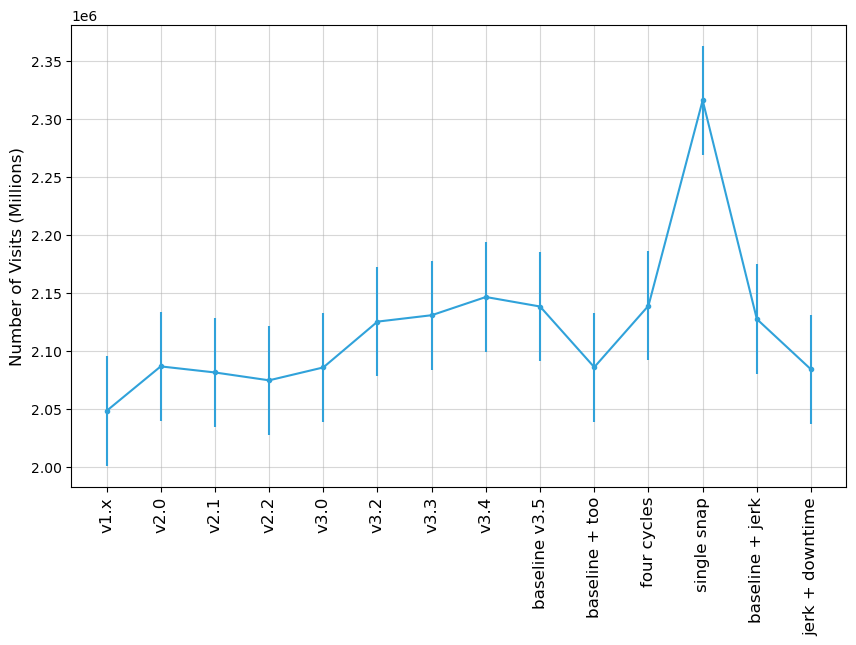

In [91]:
# How did the overall number of visits change for each simulation baseline?  Note some simulations include more shorter visits, and this will be reflected in these numbers.

cols = [m for m in summaries if "Nvisits" in m and "UniSlicer" in m and 'All' in m]
cols

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, cols],
                                 dev[cols],
                                 run_label_map=rdict)
ax.set_ylabel(f"Number of Visits (Millions)", fontsize='large')
leg = ax.get_legend()
leg.remove()
fig.savefig(os.path.join(outdir, 'total_nvisits'+ '.png'), format='png')

In [92]:
summaries.loc[runs, cols] 

metric,Identity Nvisits All visits UniSlicer
run,
retro_baseline_v2.0_10yrs,2048566.0
baseline_v2.0_10yrs,2086980.0
baseline_v2.1_10yrs,2081749.0
baseline_v2.2_10yrs,2074975.0
baseline_v3.0_10yrs,2086079.0
baseline_v3.2_10yrs,2125578.0
baseline_v3.3_10yrs,2131089.0
baseline_v3.4_10yrs,2146797.0
baseline_v3.5_10yrs,2138598.0


### SCOC subsets
<a id='SCOC'></a>
A high level overview in a mesh grid, to compare many metrics quickly but without details. 

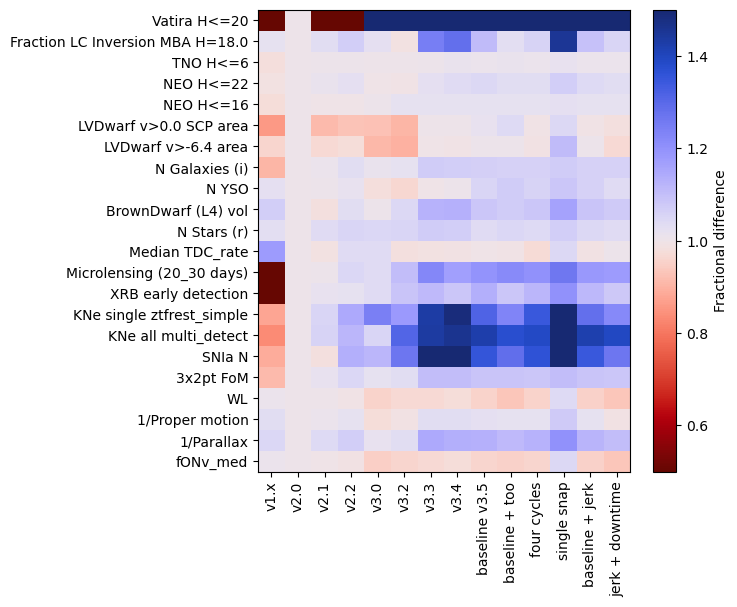

In [93]:
# What about the SCOC high-level overview? 

msub = metric_sets.loc['SCOC']
m = [m for m in summaries if 'Vatira' in m and 'quad' in m and 'CumulativeCompleteness' in m and 'Time' not in m and '20.0' in m]
md = maf.create_metric_subset('vatira', m, short_name=['Vatira H<=20'])
md
msub = pd.concat([msub, md.loc['vatira']])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[runs, msub['metric']], 
                     baseline_run='baseline_v2.0_10yrs',
                     metric_subset=msub,
                        metric_label_map=msub['short_name'],
                        run_label_map=rdict
                      )
fig.savefig(os.path.join(outdir, 'scoc_grid'+ '.png'), format='png')

['retro_baseline_v2.0_10yrs', 'baseline_v2.0_10yrs', 'baseline_v3.4_10yrs', 'baseline_v3.5_10yrs']


metric,SNIa N,KNe all multi_detect,KNe single ztfrest_simple,XRB early detection,Microlensing (20_30 days),Median TDC_rate,NEO H<=16,NEO H<=22,TNO H<=6,Fraction LC Inversion MBA H=18.0,Vatira H<=20
run,,,,,,,,,,,
retro_baseline_v2.0_10yrs,0.657050,0.587073,0.666667,0.337711,0.235200,1.178803,0.952212,0.944614,0.969131,0.923264,0.000000
baseline_v2.0_10yrs,0.739395,0.702484,0.760757,0.882739,0.835521,1.001993,0.977254,0.956698,0.989282,0.902558,0.007672
baseline_v3.4_10yrs,1.153956,1.023747,1.129416,0.958255,0.978570,0.990351,0.998539,0.991226,1.002306,1.157125,0.988583
baseline_v3.5_10yrs,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


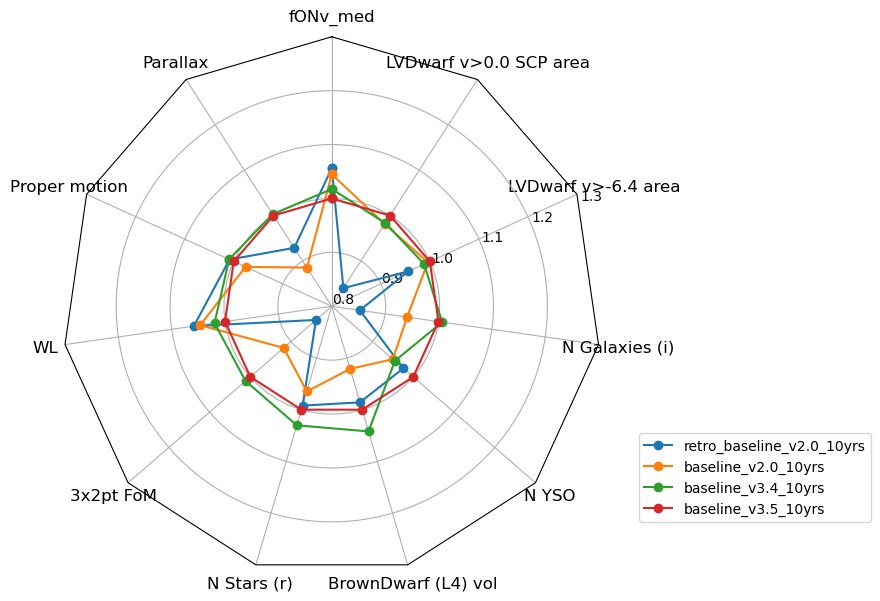

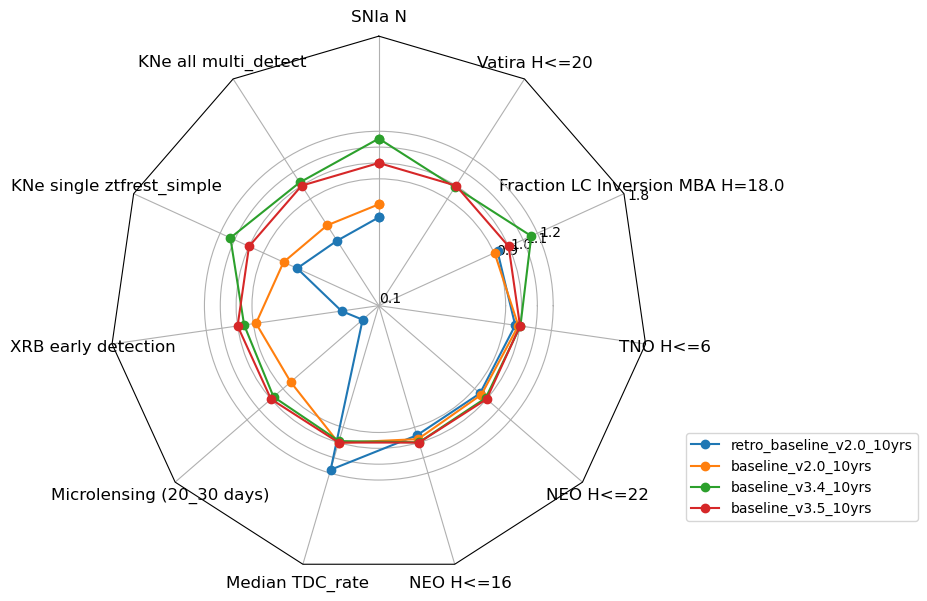

In [95]:
# And some classic 'radar' plots, but only use a subset of the baseline runs
rr = ['retro_baseline_v2.0_10yrs',  'baseline_v2.0_10yrs', 'baseline_v3.4_10yrs',  'baseline_v3.5_10yrs']
rbaseline = 'baseline_v3.4_10yrs'
print(rr)

mset = msub

statics = np.array([0, 1, 2, 3, 4, 11, 12, 13, 14, 15, 16])
variable = [i for i in np.arange(0, len(mset)) if i not in statics]

mset_stat = mset.iloc[statics]
mset_var = mset.iloc[variable]

normed = maf.normalize_metric_summaries(baseline,
                                        summaries.loc[rr, mset_stat['metric']],
                                        mset)
normed.columns = normed.columns.map(mset['short_name'])
normed

fig, ax = maf.radar(normed, rgrids=[0.80, 0.9, 1.0, 1.1, 1.2, 1.3], figsize=(8, 8), bbox_to_anchor=[1.5, 0.1])
ax.tick_params(axis='x', labelsize='large')
ax.tick_params(axis='y', labelsize='medium')
fig.set_figwidth(8)
fig.set_figheight(7)


normed = maf.normalize_metric_summaries(baseline,
                                        summaries.loc[rr, mset_var['metric']],
                                        mset)
normed.columns = normed.columns.map(mset['short_name'])
normed

fig, ax = maf.radar(normed, rgrids=[0.10, 0.9, 1.0, 1.1, 1.2, 1.8], figsize=(8, 8), bbox_to_anchor=[1.5, 0.1])
ax.tick_params(axis='x', labelsize='large')
ax.tick_params(axis='y', labelsize='medium')
fig.set_figwidth(8)
fig.set_figheight(7)
normed.loc[rr]

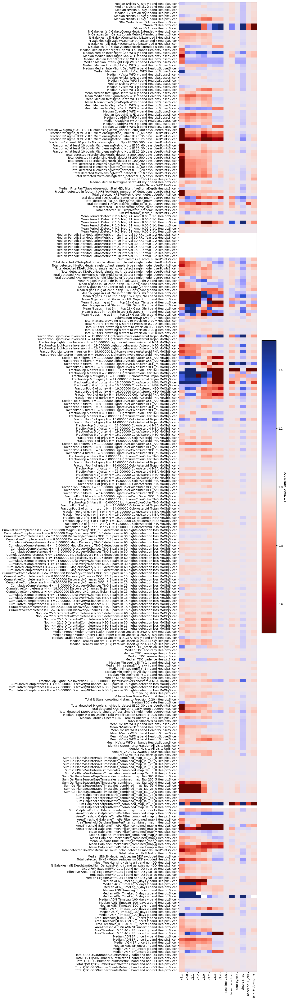

In [98]:
# Plot all the metrics, resulting in a very big and messy plot. Look at overall trends, or for things to investigate further.
non_dd = [m for m in msets if 'DD' not in m]
msub = metric_sets.loc[non_dd].reset_index(drop=True).drop('style', axis=1).drop('short_name', axis=1)
msub = msub.drop_duplicates().set_index('metric', drop=False, verify_integrity=True)

fig, ax = maf.plot_run_metric_mesh(summaries.loc[runs, msub['metric']], 
                     baseline_run=baseline,
                     metric_subset=msub,
                        #metric_label_map=msub['short_name'],
                        run_label_map=rdict)
#fig.set_figwidth(24)
fig.set_figheight(60)
fig.savefig(os.path.join(outdir, 'all_grid'+ '.png'), format='png')

Now we look at the metrics results for subsets of metrics, looking in more depth (which allows us to include error bars which come from the standard deviation of the metric results in the weather runs.

### SRD
<a id="SRD"></a>
Metrics coming from the Science Requirements Document, the [SRD](ls.st/srd). 

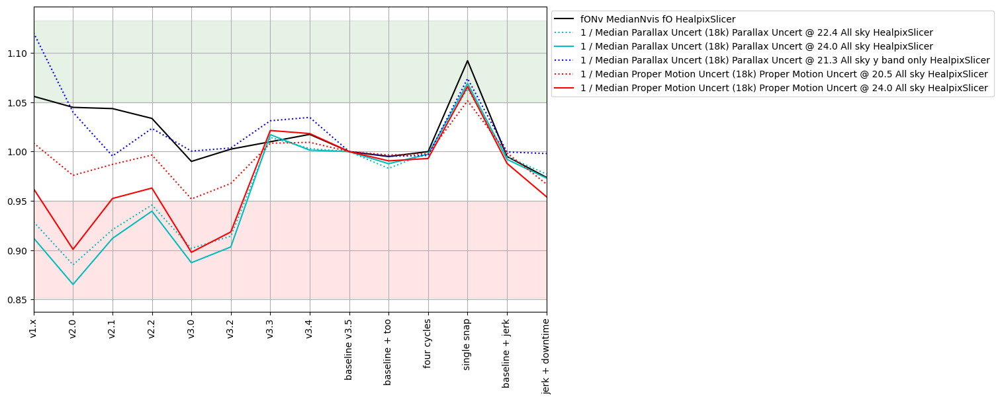

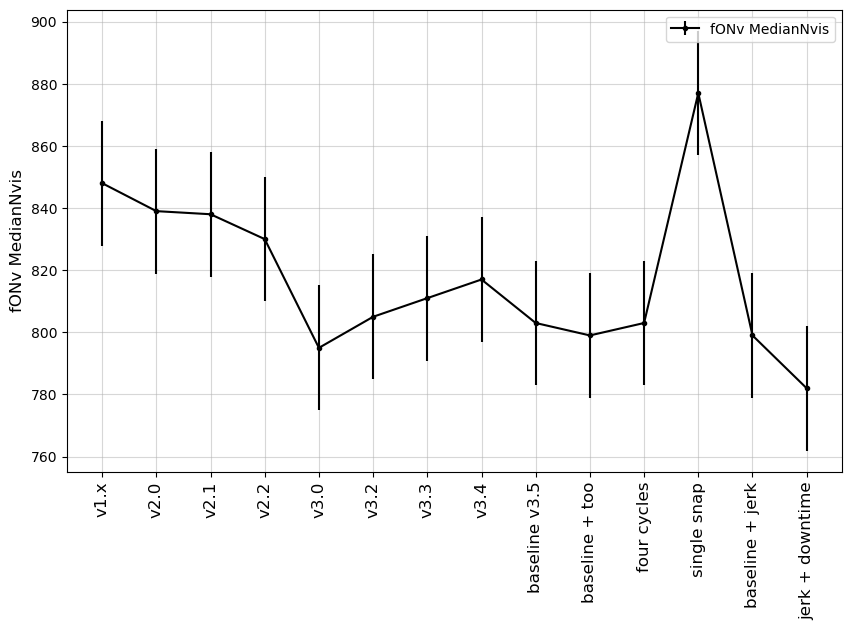

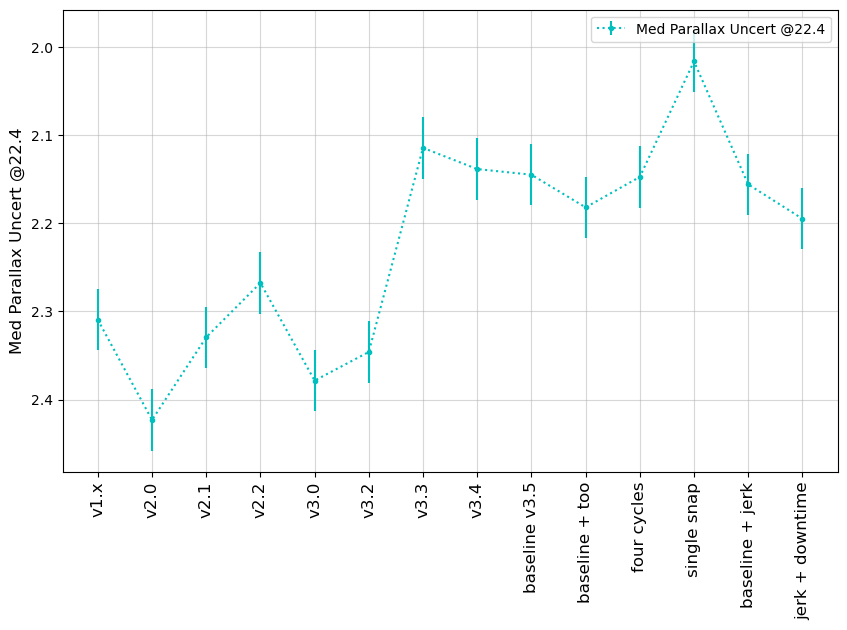

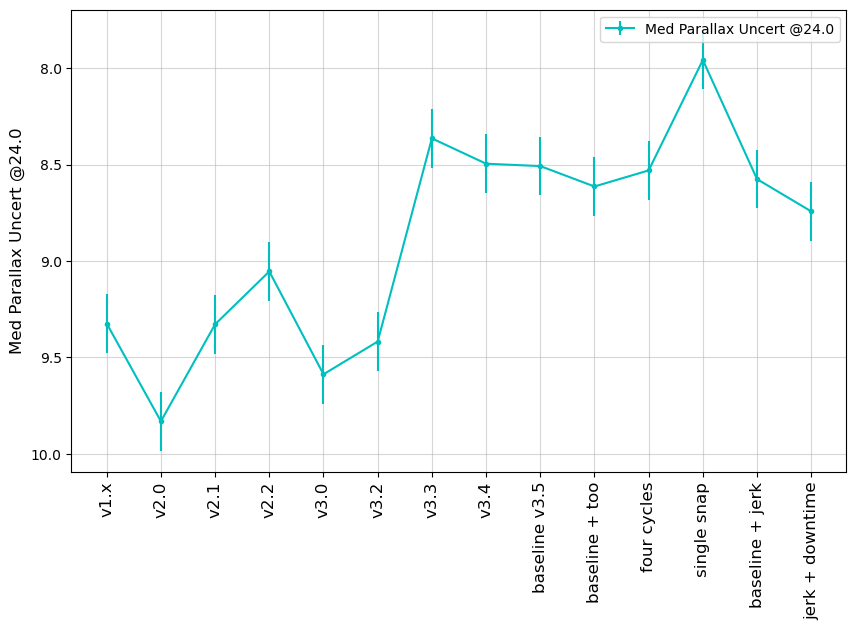

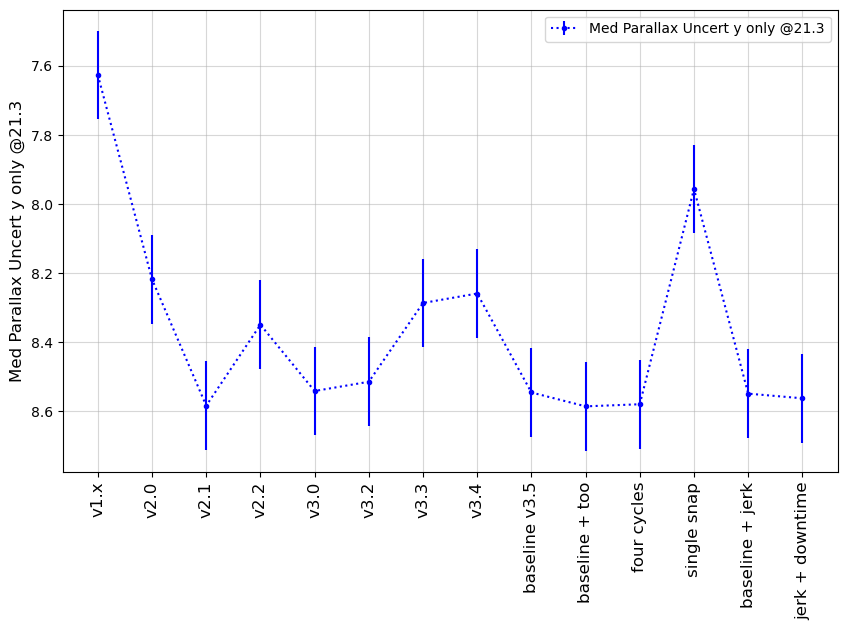

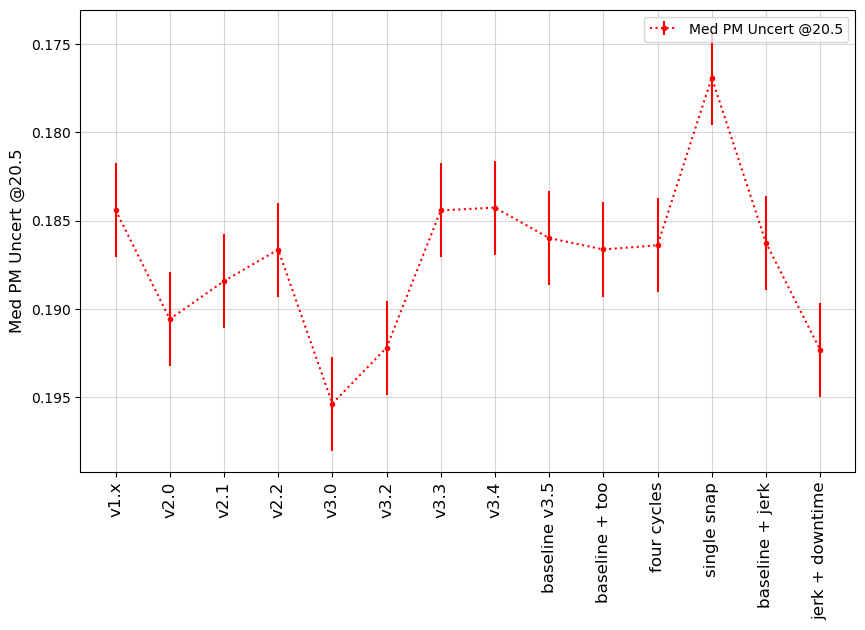

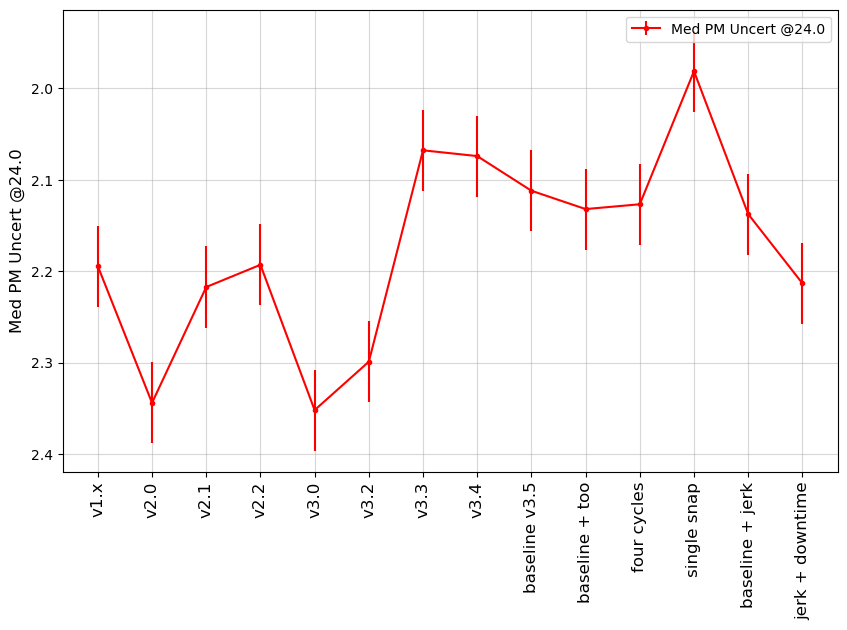

In [101]:
msub = metric_sets.loc['SRD']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub,)

### DESC WFD
<a id="DESC WFD"></a>
Metrics related to DESC WFD goals. These include both static science and transient science.

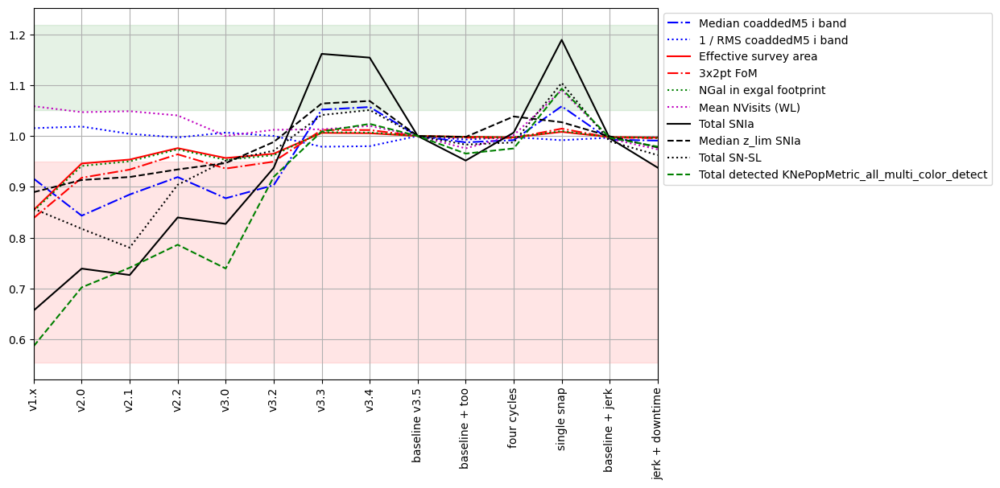

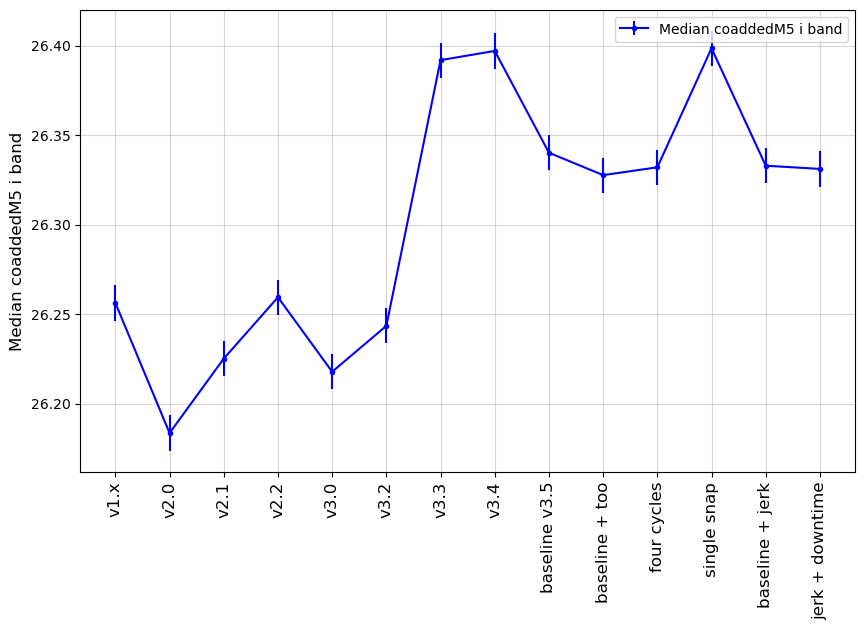

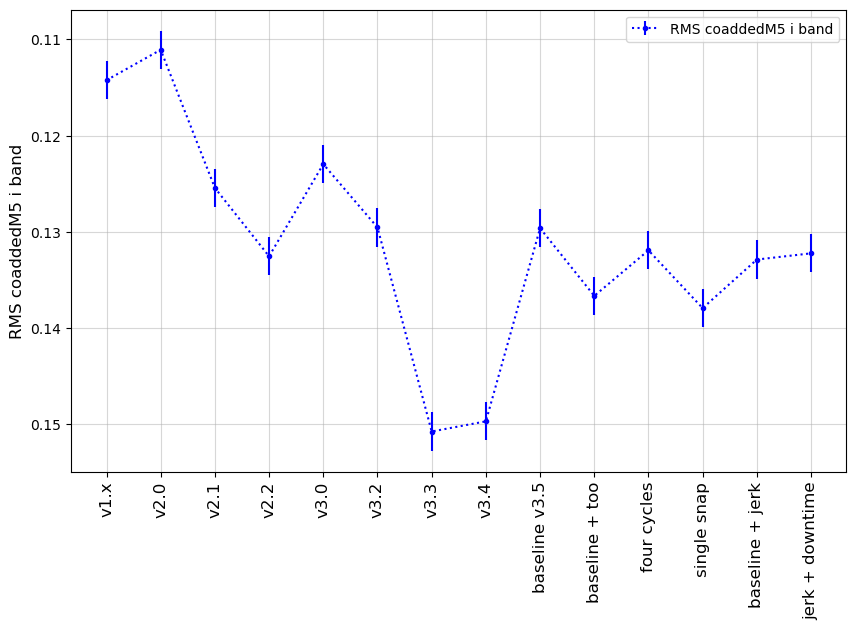

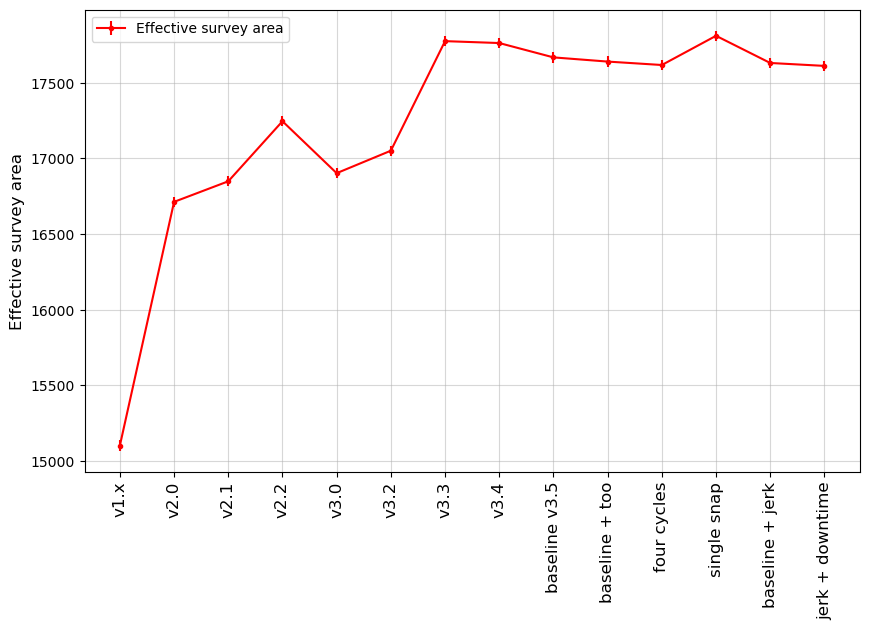

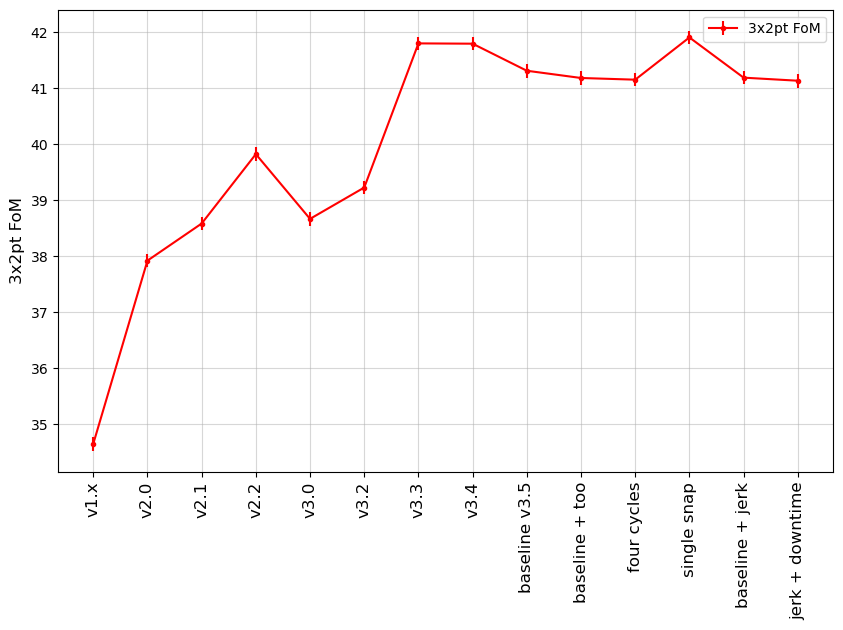

...

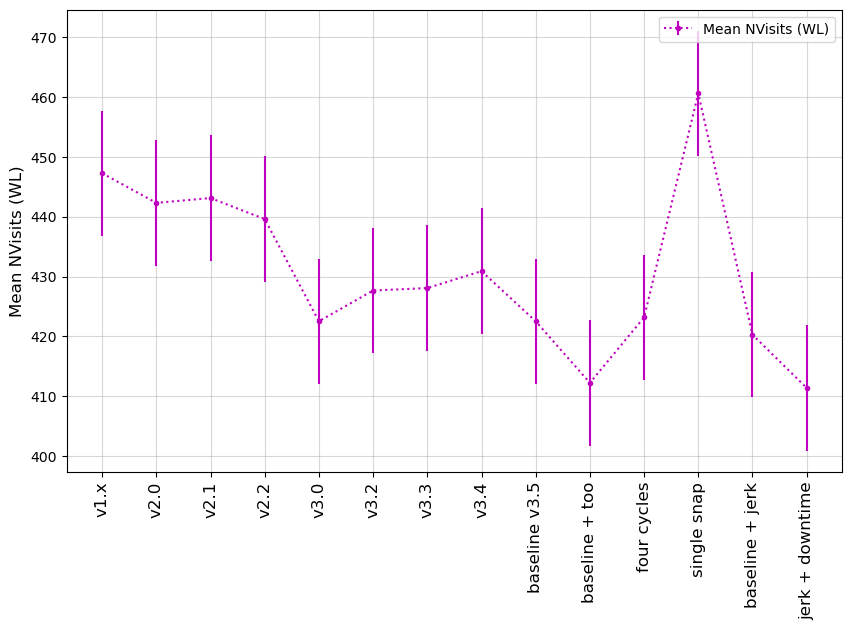

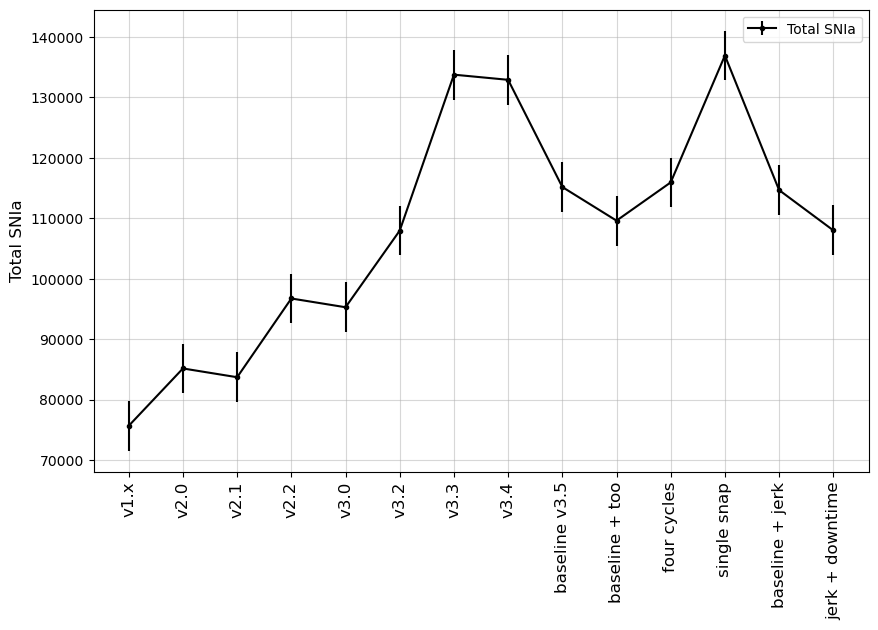

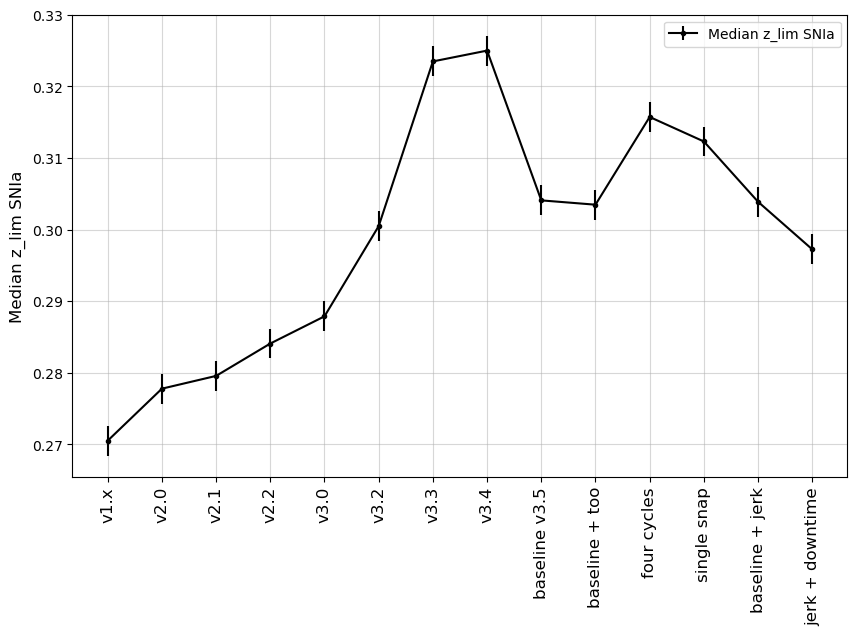

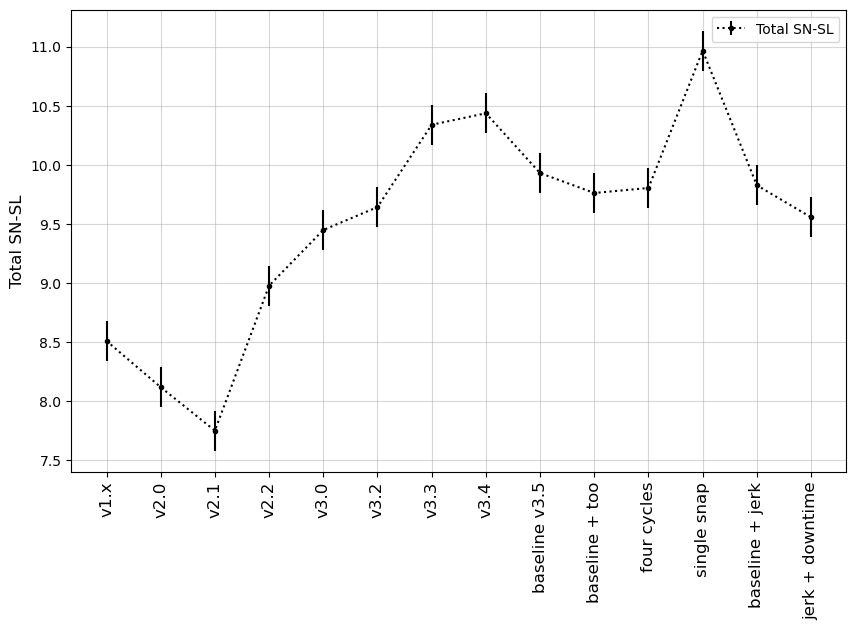

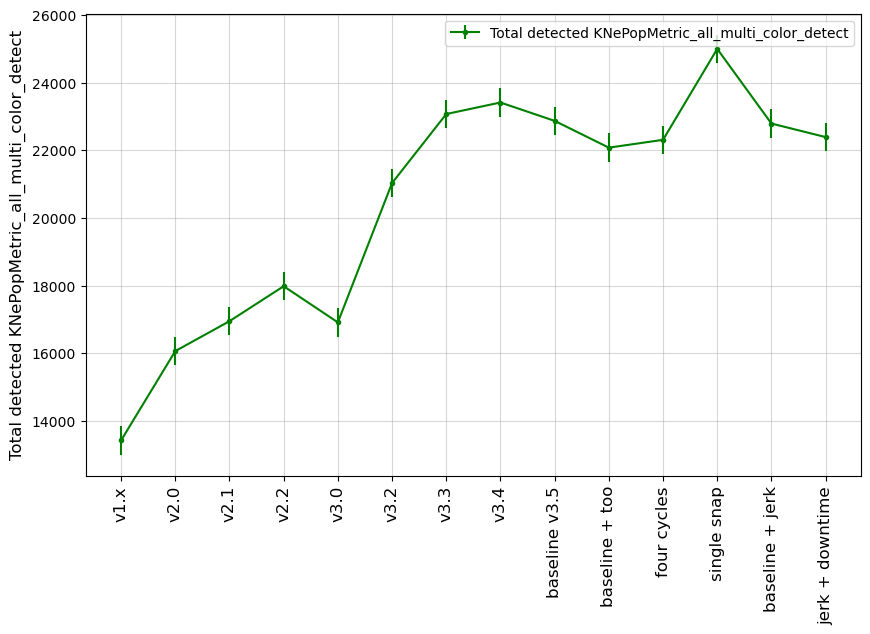

In [103]:
msub = metric_sets.loc['DESC WFD']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub)

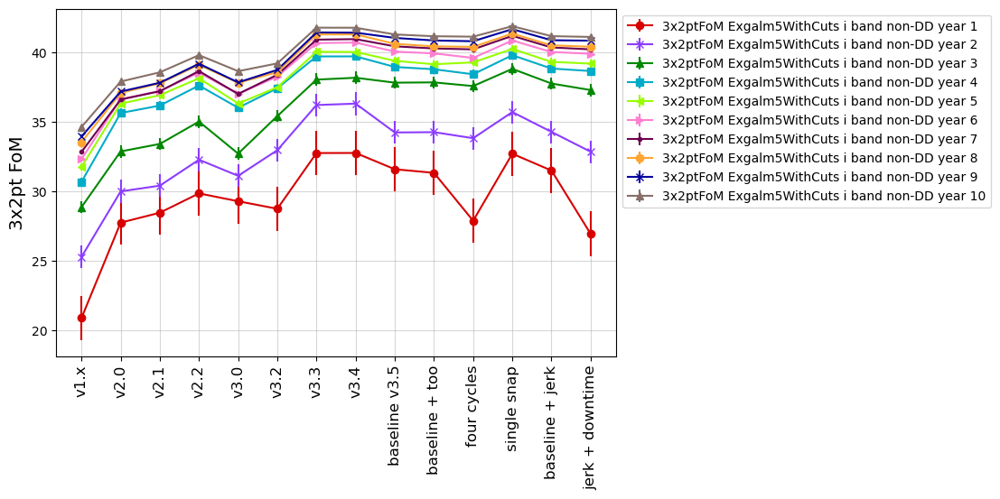

In [105]:
# Compare 3x2pt FOM metrics at individual years, between different simulations.
m1 = []
for yr in range(1, 11):
    m1 += [f'3x2ptFoM Exgalm5WithCuts i band non-DD year {yr} HealpixSlicer']

mset = maf.create_metric_subset('3x2pt', 
                                metrics=m1, 
                                short_name=[m.replace(' HealpixSlicer', '') for m in m1],
                               )
msub = mset.loc['3x2pt']

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=colorcet.glasbey_bw,
                                 metric_subset=msub,
                                 markers=['o', 'x', '^', 's', '<', '>', '.', ],
                                 sep_plots=False)                                 
ax.set_ylabel("3x2pt FoM", fontsize='x-large')
fig.set_figwidth(8)
fig.set_figheight(5)

### Transient and Variable Stars
<a id="TVS"></a>
Metrics related to Transient and Variable Stars collaboration goals. 

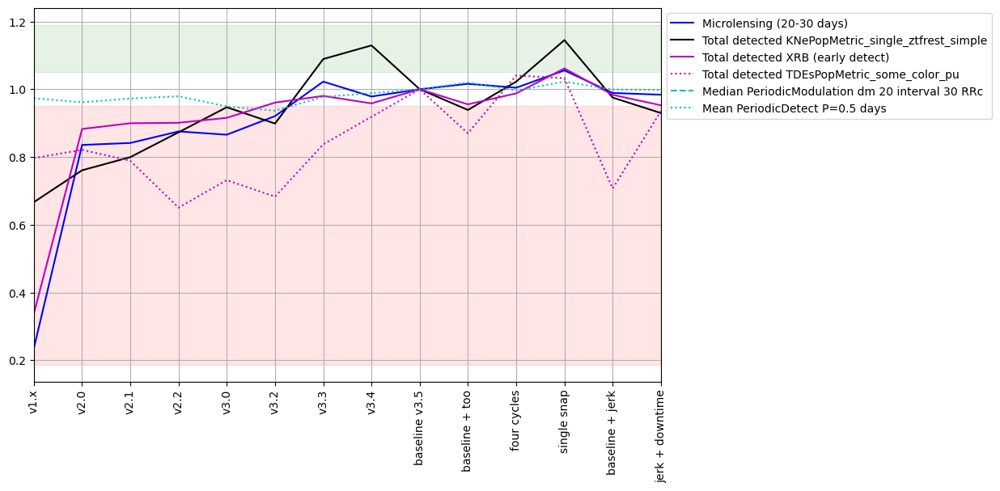

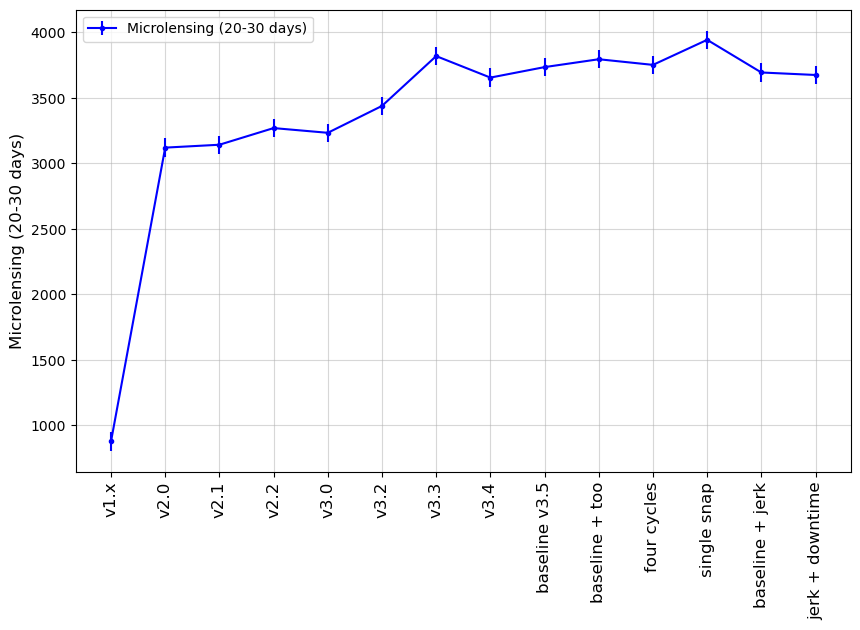

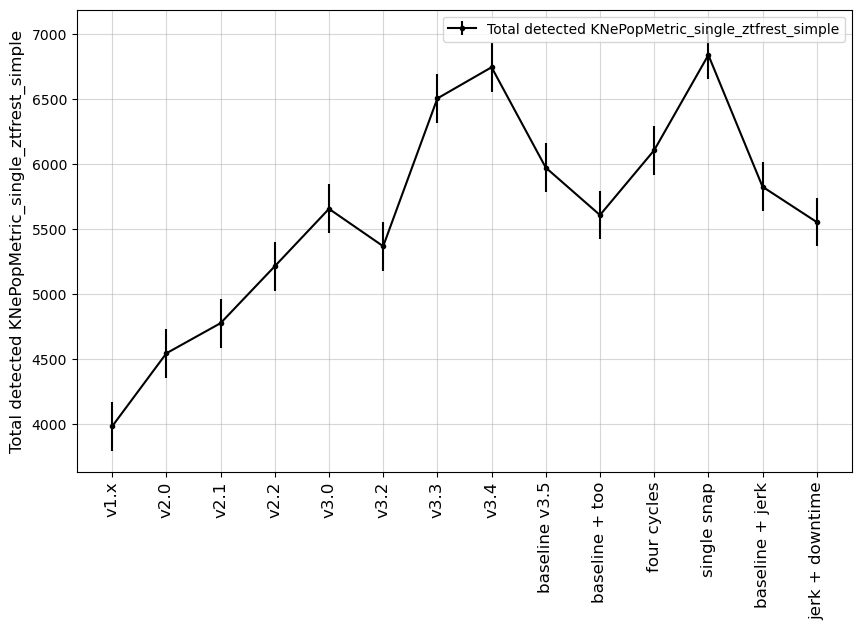

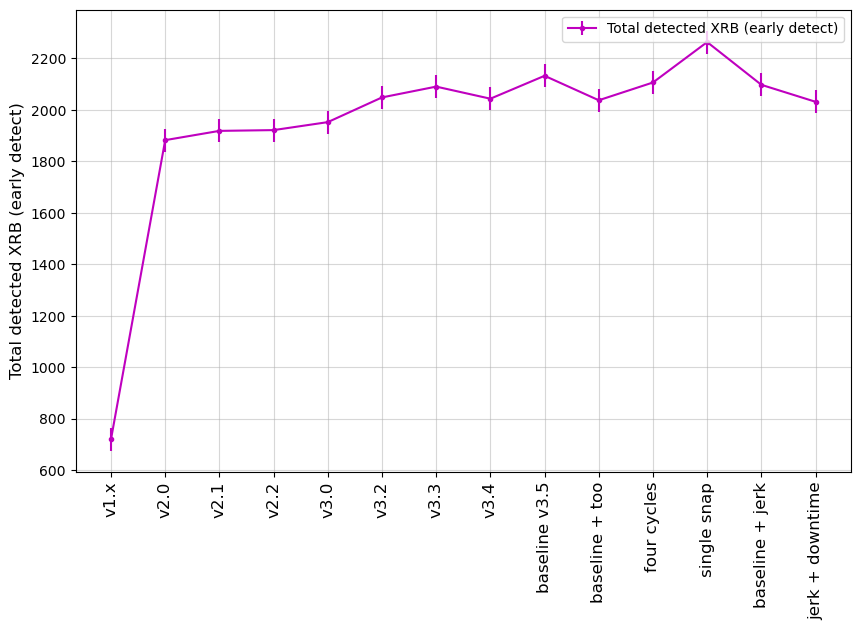

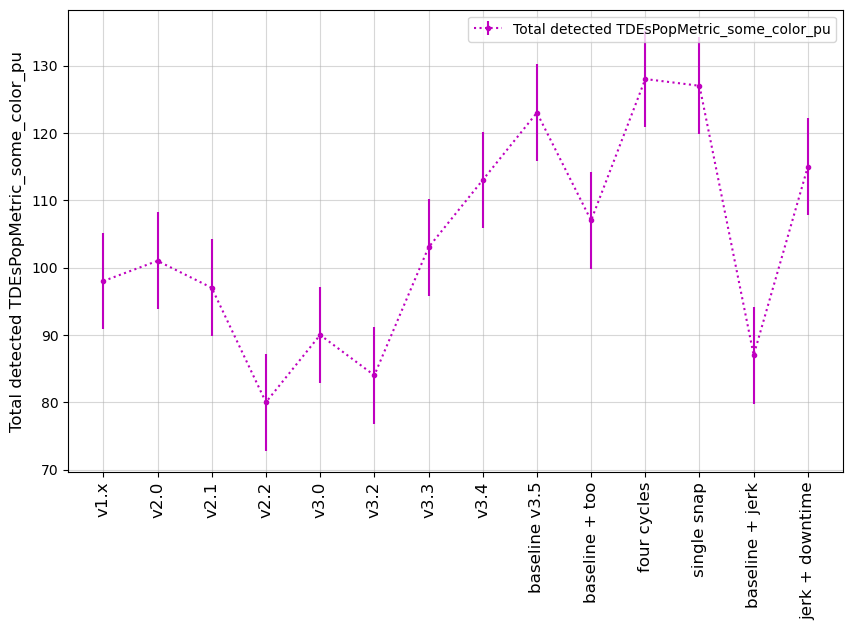

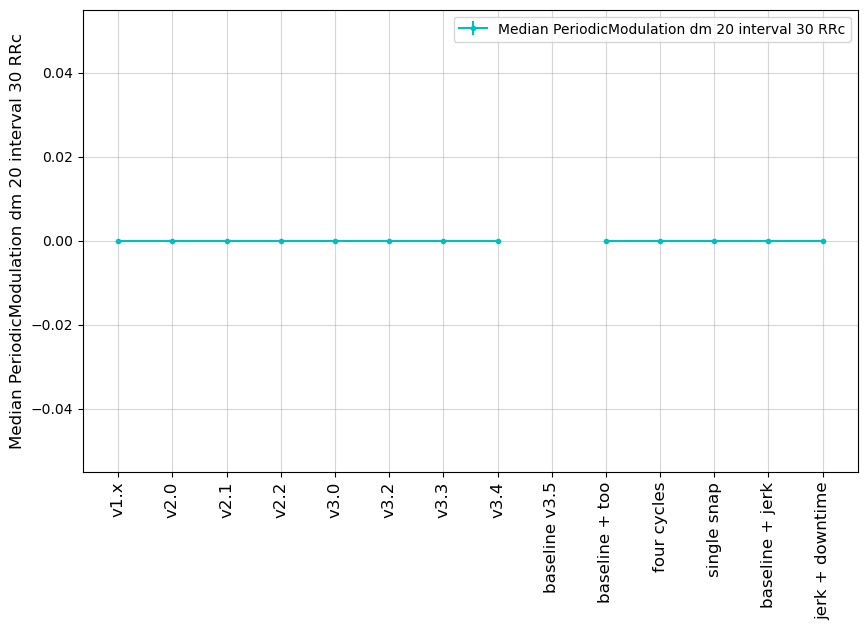

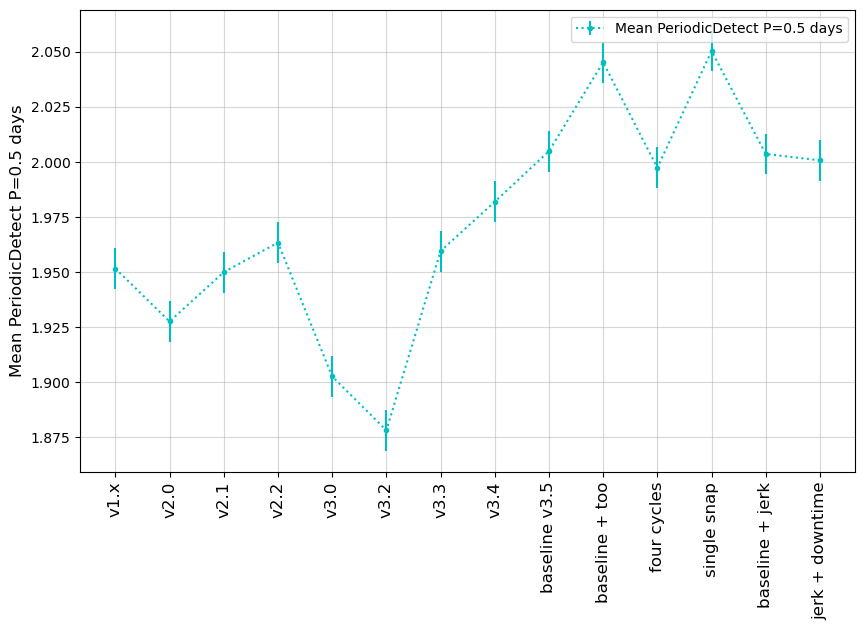

In [106]:
msub = metric_sets.loc['TVS short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub)

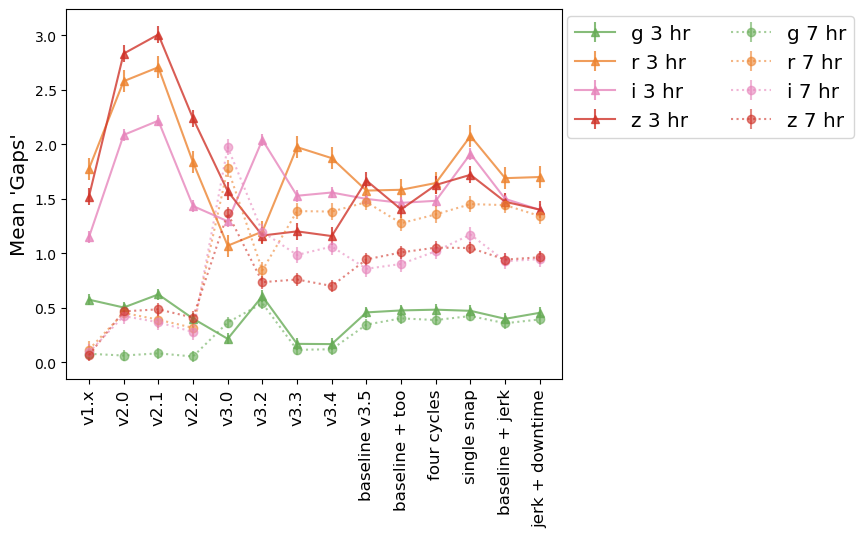

In [107]:
# Time Gaps metric 

fig, ax = plt.subplots()
mset = metric_sets.loc['TVS Gaps'][0:8]


markers = ['o', 's', '*', '<', '^', 'v', '*', '>', '.', 'X']
j = 0
for i, mm in mset.iterrows():
    m = mm['metric']
    ff = mm['short_name'].split('in ')[-1].split(' at')[0]
    #marker= markers[j]
    marker = 'o'
    if '3' in m:
        marker = '^'
        linestyle='-'
        alpha=0.8
        label=f"{ff} 3 hr"
    if '7' in m:
        marker = 'o'
        linestyle=':'
        alpha=0.6
        label =f"{ff} 7 hr"
    j += 1
    ax.errorbar(list(rdict.values()), summaries.loc[runs, m], yerr=dev[m], 
                color=filter_rgb_map[ff], alpha=alpha, marker=marker, linestyle=linestyle, label=label)
plt.legend(loc=(1.01, 0.65), fontsize='x-large', ncols=2)
ax.set_ylabel("Mean 'Gaps'", fontsize='x-large')
ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
fig.savefig(os.path.join(outdir, 'tgaps' + '.png'), format='png')

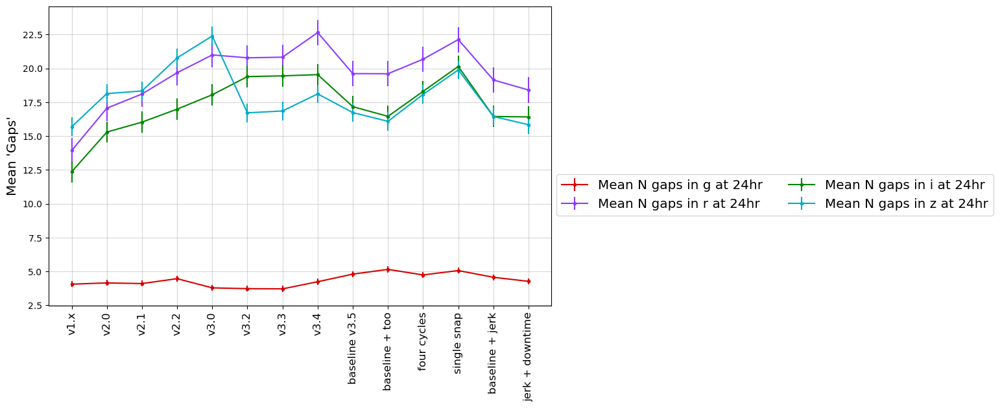

In [108]:
msub = metric_sets.loc['TVS Gaps'][8:12]

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=colorcet.glasbey_dark,
                                 metric_subset=msub, sep_plots=False)
plt.legend(loc=(1.01, 0.3), fontsize='x-large', ncols=2)
ax.set_ylabel("Mean 'Gaps'", fontsize='x-large')
ax.tick_params(axis='x', labelrotation = 90, labelsize='large')

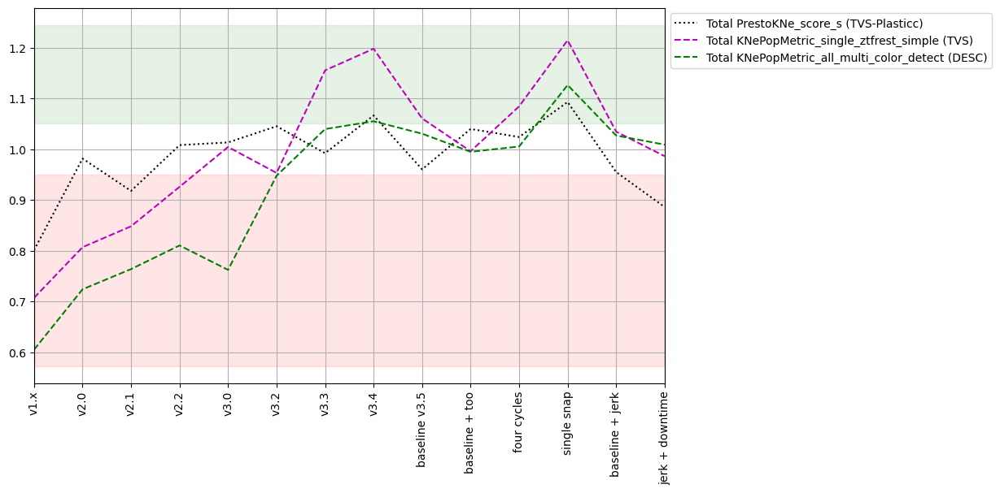

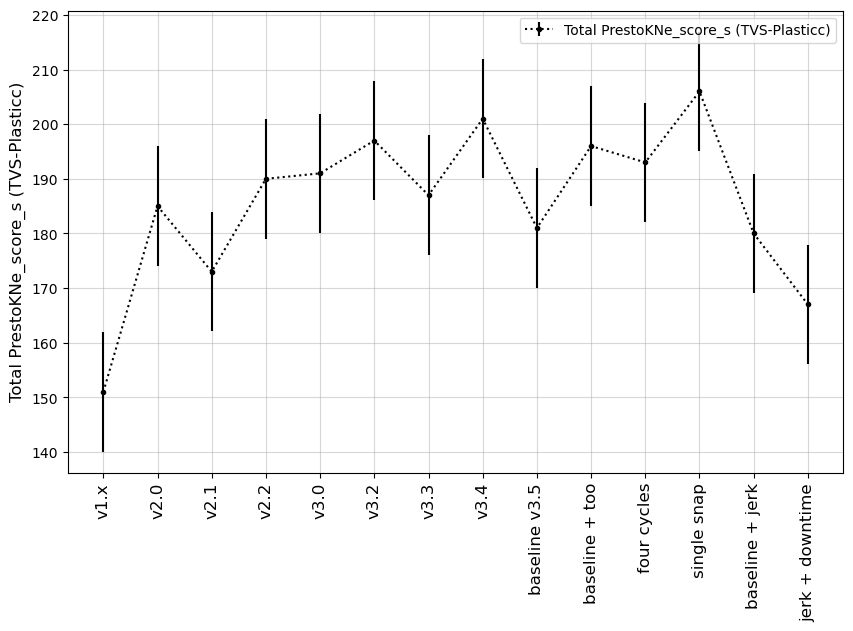

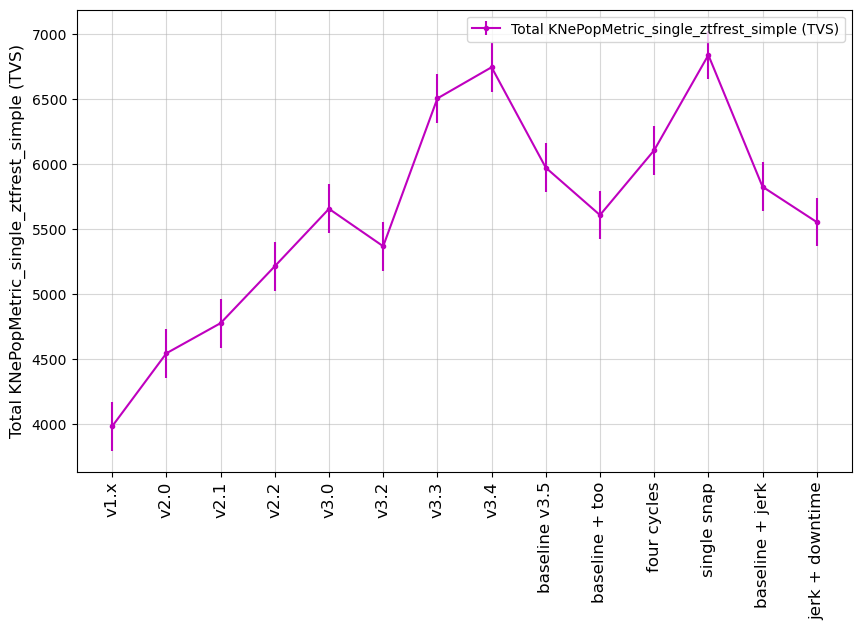

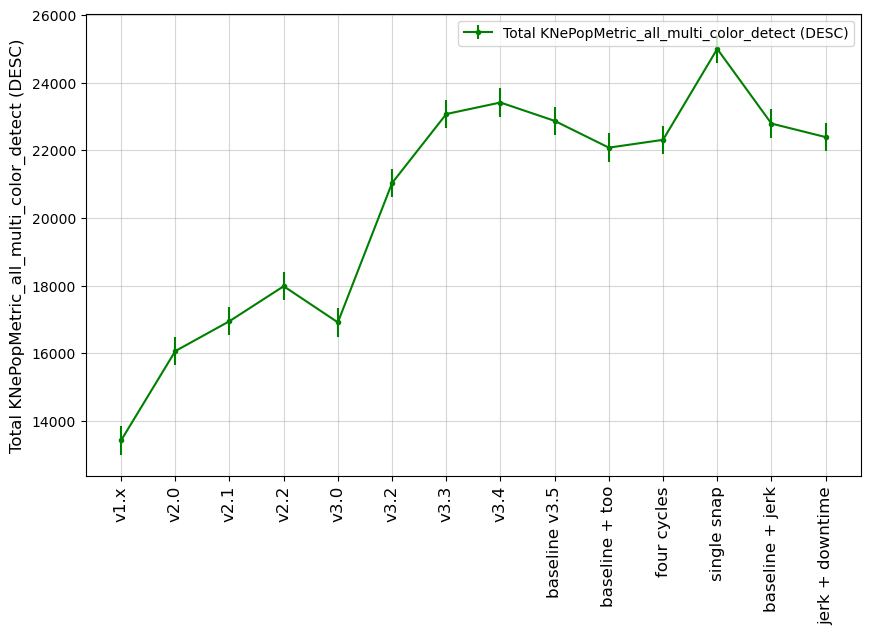

In [109]:
msub = metric_sets.loc['TVS KNe short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=runs,
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub)

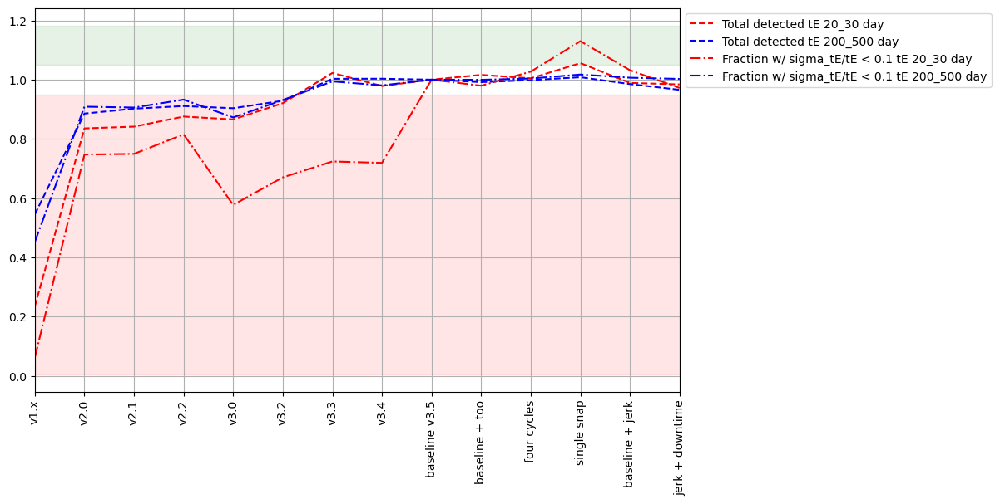

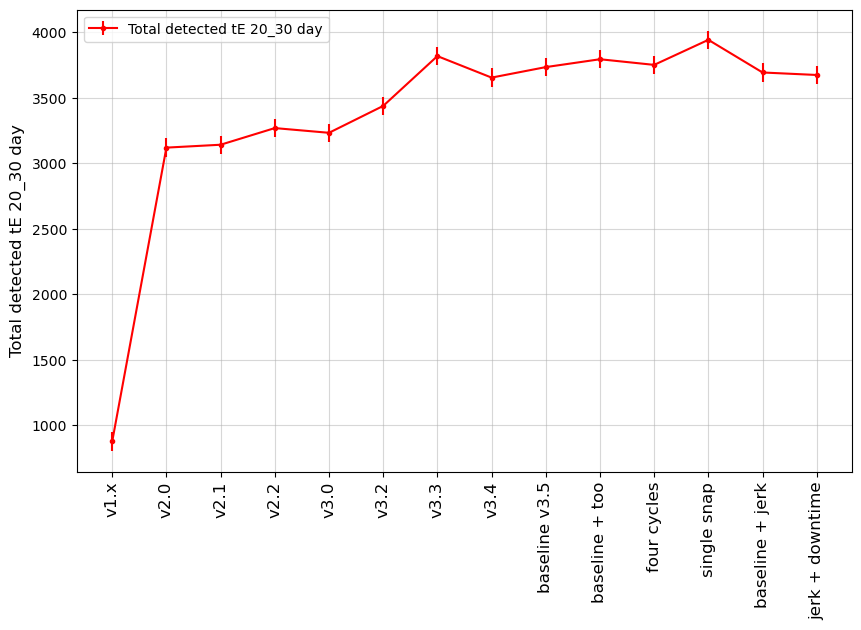

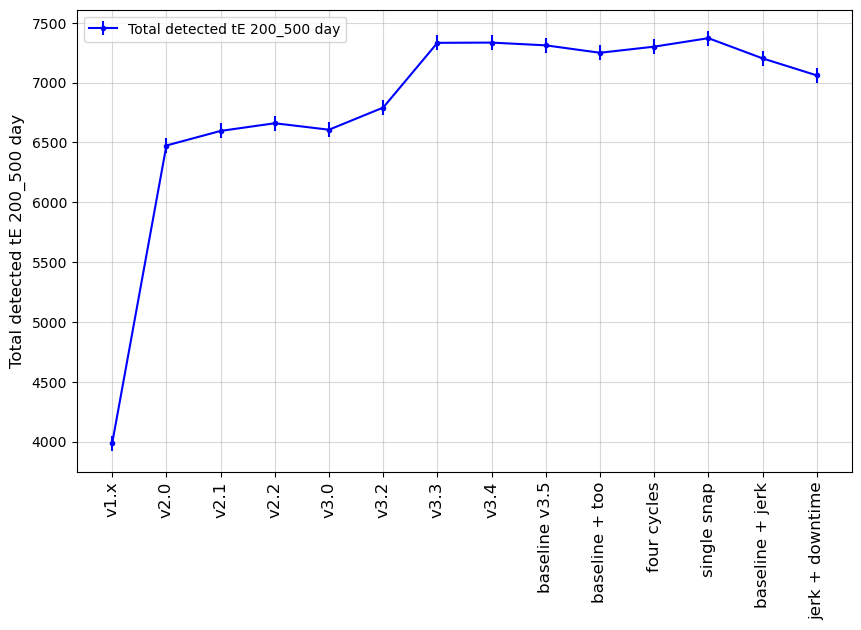

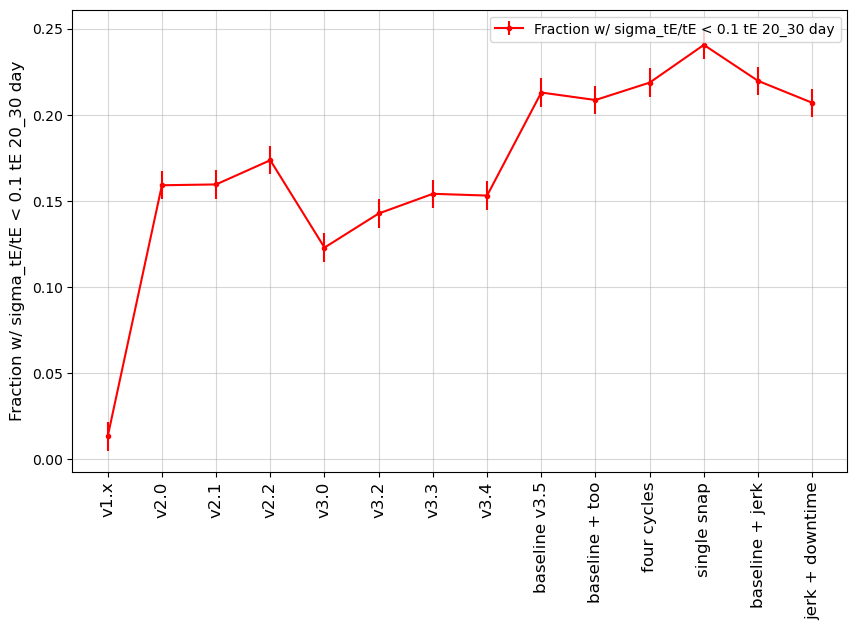

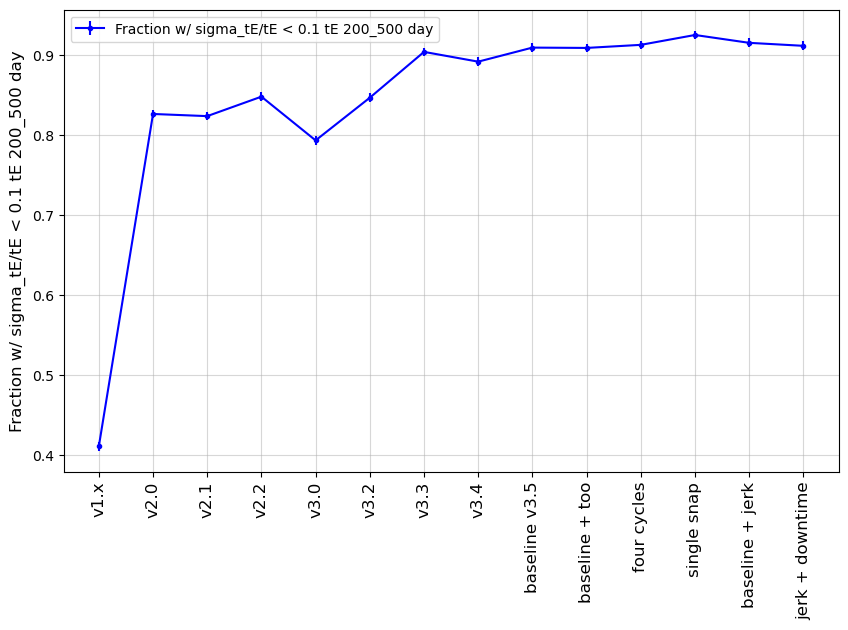

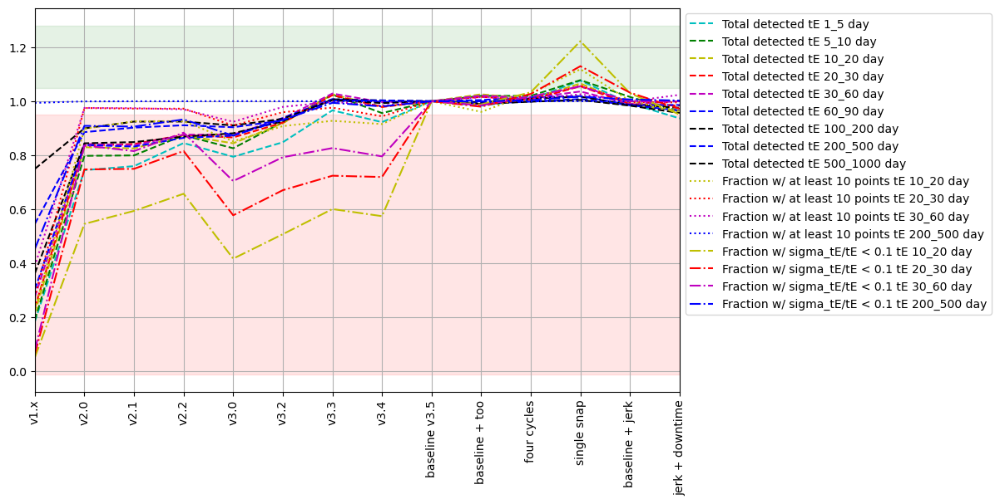

In [110]:
msub = metric_sets.loc['TVS microlensing short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

msub = metric_sets.loc['TVS microlensing all']
fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

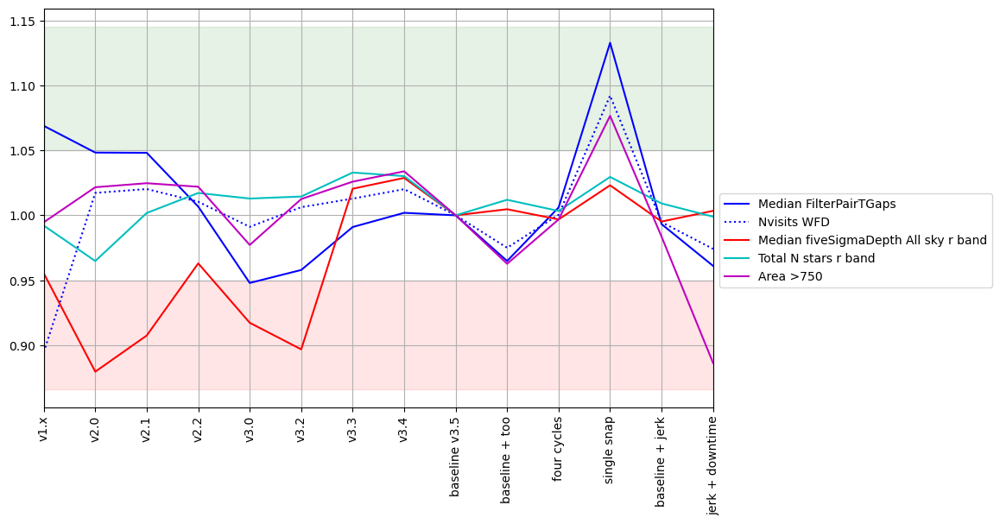

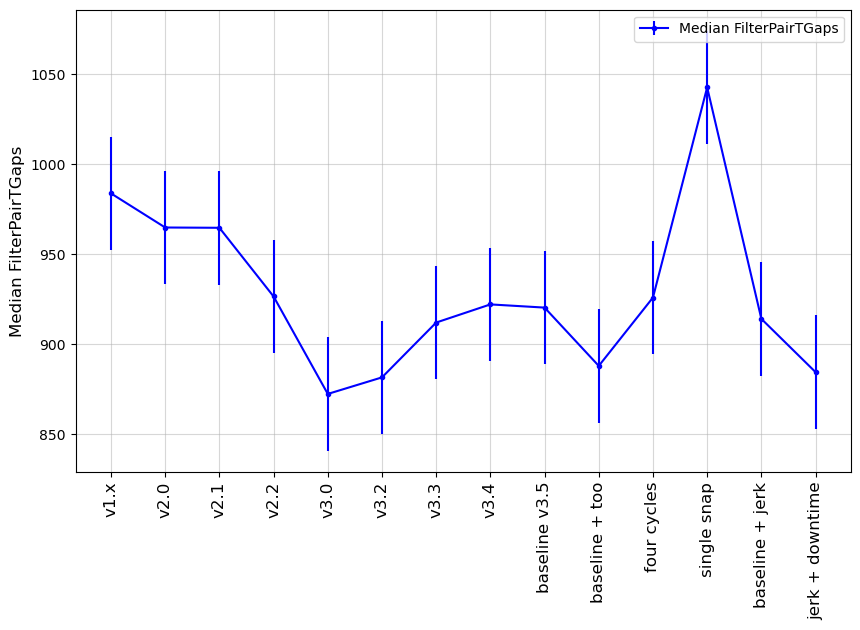

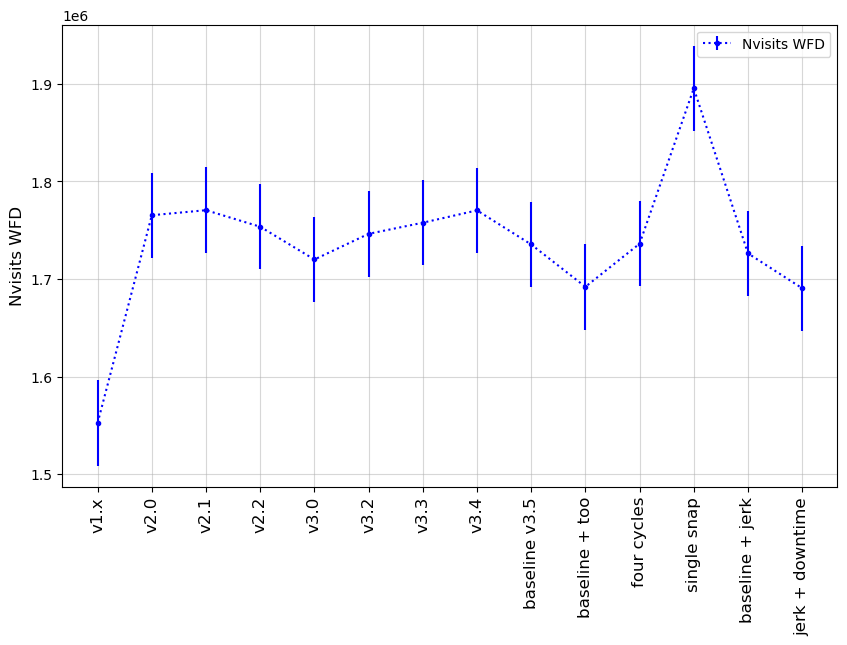

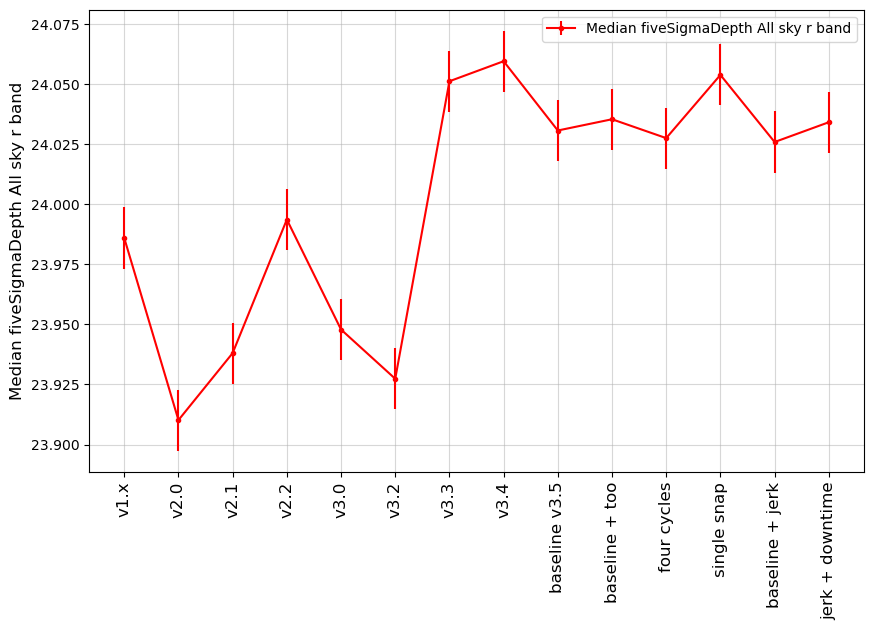

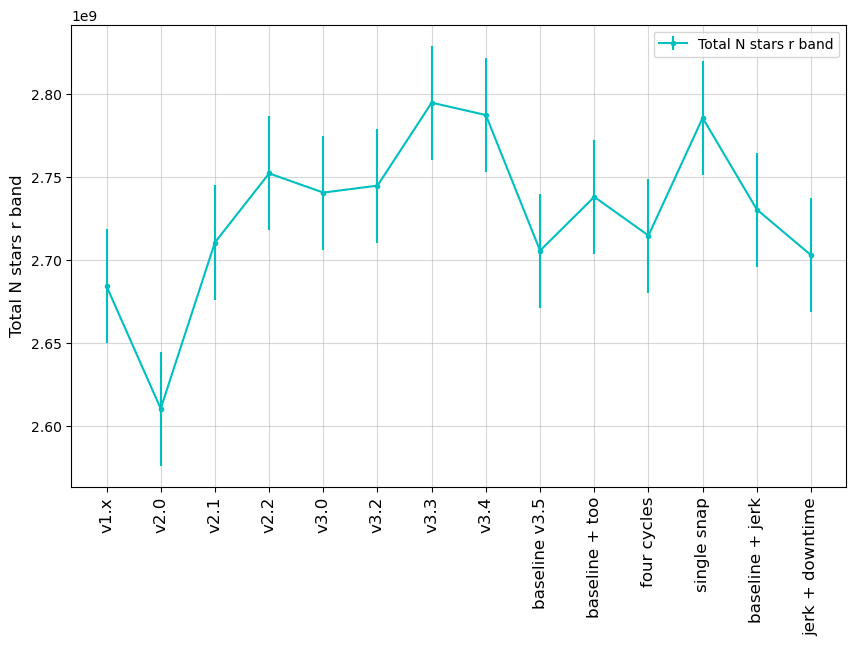

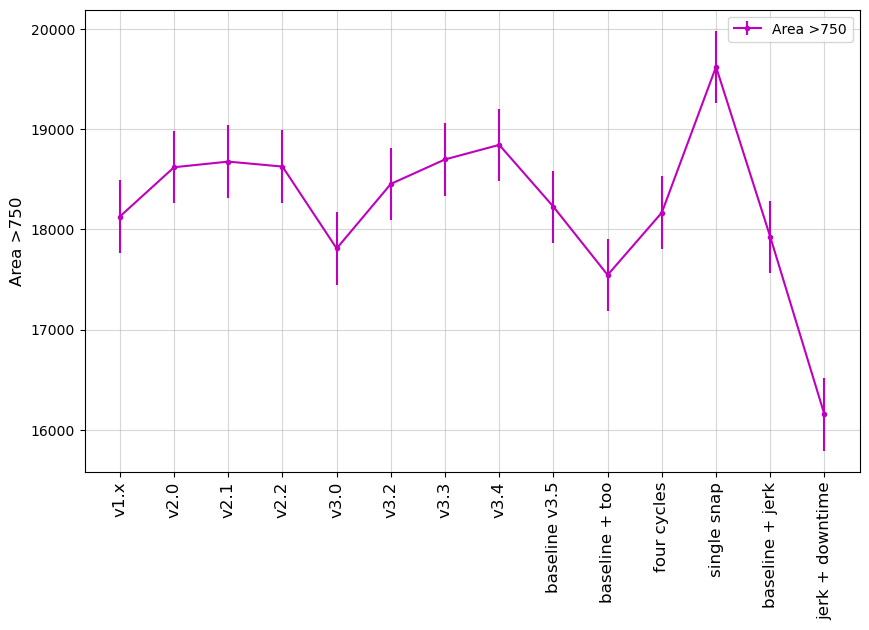

In [111]:
msub = metric_sets.loc['TVS anomalies']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')
ax.legend(loc=(1.01, 0.3))
              
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub)

### Solar System Objects
<a id="SSO"></a>
Metrics related to Solar System Science Collaboration goals. 

In [112]:
class TTotalNumberSSO(maf.BaseMoMetric):
    """Calculate the total number of objects of a given population
    expected at a given H value or larger.

    Operations on differential completeness values
    (or equivalent; fractions of the population is ok if
    still a differential metric result, not cumulative).

    Parameters
    ----------
    h_mark : `float`, optional
        The H value at which to calculate the expected total number of objects.
    dndh_func : function, optional
        The dN/dH distribution used calculate the expected population size.

    Returns
    -------
    nObj : `float`
        The predicted number of objects in the population.
    """

    def __init__(self, h_mark=22, dndh_func=maf.neo_dndh_granvik, dndh_args=None, **kwargs):
        self.h_mark = h_mark
        self.dndh_func = dndh_func
        self.dndh_args = dndh_args
        metric_name = "Nobj <= %.1f" % (h_mark)
        super().__init__(metric_name=metric_name, **kwargs)

    def run(self, metric_vals, h_vals):
        totals = maf.sum_over_h(metric_vals, h_vals, self.dndh_func, **self.dndh_args)
        n_obj = np.interp(self.h_mark, h_vals, totals)
        return n_obj

retro_baseline_v2.0_10yrs nan
baseline_v2.0_10yrs nan
baseline_v2.1_10yrs nan
baseline_v2.2_10yrs nan
baseline_v3.0_10yrs nan
baseline_v3.2_10yrs nan
baseline_v3.3_10yrs nan
baseline_v3.4_10yrs 45044.095418505894
baseline_v3.5_10yrs 42999.0273727001
too_v3.5_10yrs 42672.20091507594
four_cycle_v3.5_10yrs 44334.43432922958
one_snap_v3.5_10yrs 45485.06069813199
telescope_jerk_v3.5_10yrs 43306.402062154855
telescope_jerk_downtimes_v3.5_10yrs 42708.966219040565


16.968894952251024

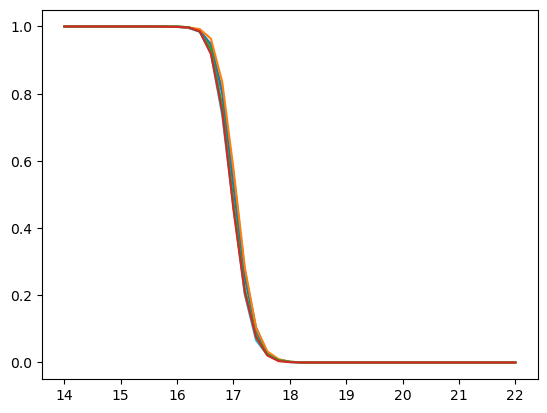

In [113]:
metrics = [c for c in summaries if 'Trojan' in c and 'DifferentialCompleteness' in c and 'DiscoveryNChances' in c 
           and '3 pairs in 15 nights detection loss' in c]
hvals = [float(m.split("= ")[1].split(" DiscoveryNChances")[0]) for m in metrics]
hrange = np.sort(np.array(hvals))

# NTr5 = 794 × 10^0.44(H−12)
# NTNO = 71,400 × 10^0.63(H−9.1),
# NNEA = 960 × 10^0.35(H−18)
kwargs = {'no': 794, 'ho': 12, 'h_index': 0.44}
total_num = TTotalNumberSSO(h_mark=25, dndh_func=maf.power_law_dndh, dndh_args=kwargs)
for r in runs:
    _ = plt.plot(hrange, summaries.loc[r, metrics].values)
    nobj = total_num.run(summaries.loc[r, metrics].values, hrange)
    print(r, nobj)
mask  = np.where(hrange > 6.2)
#50 percent H value
np.interp(0.5, 1-summaries.loc[r, metrics].values[mask], hrange[mask])

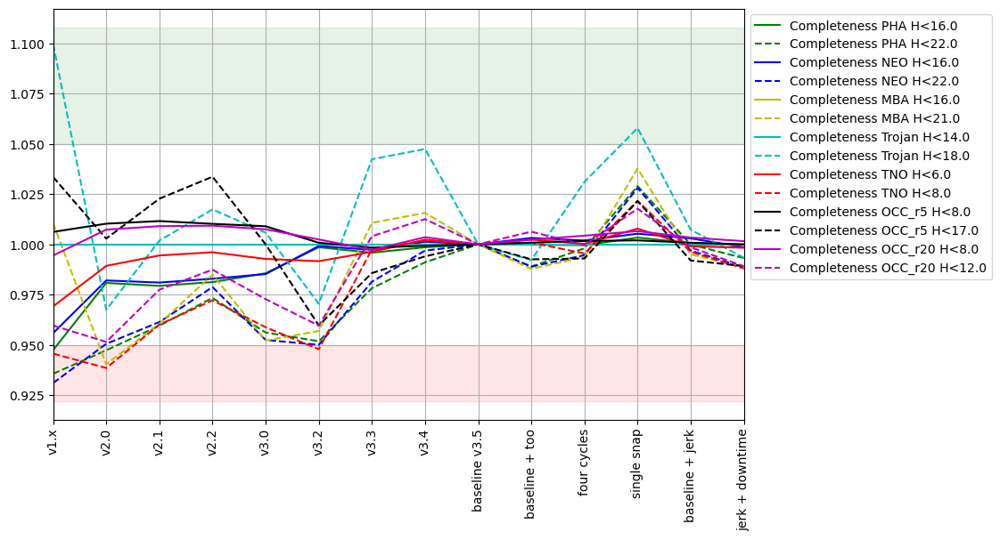

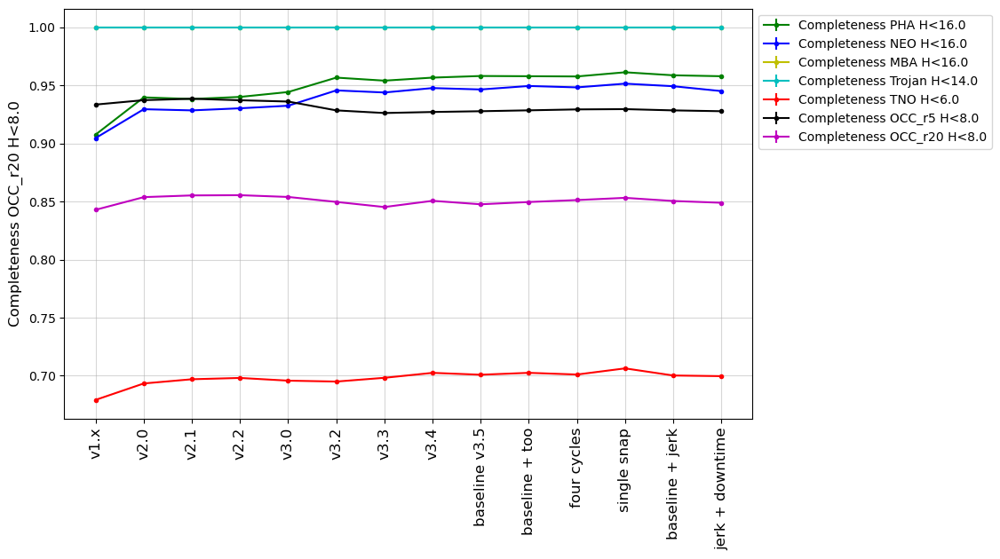

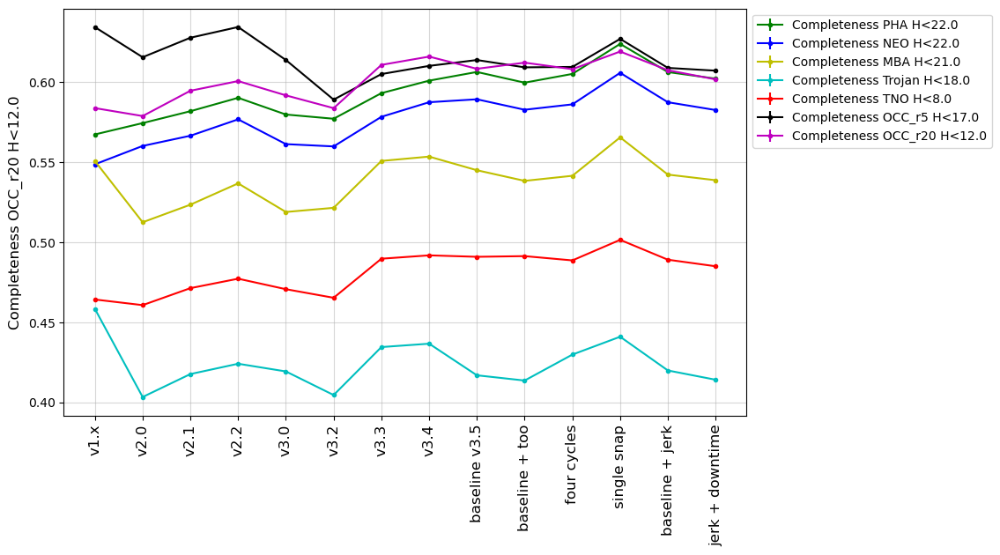

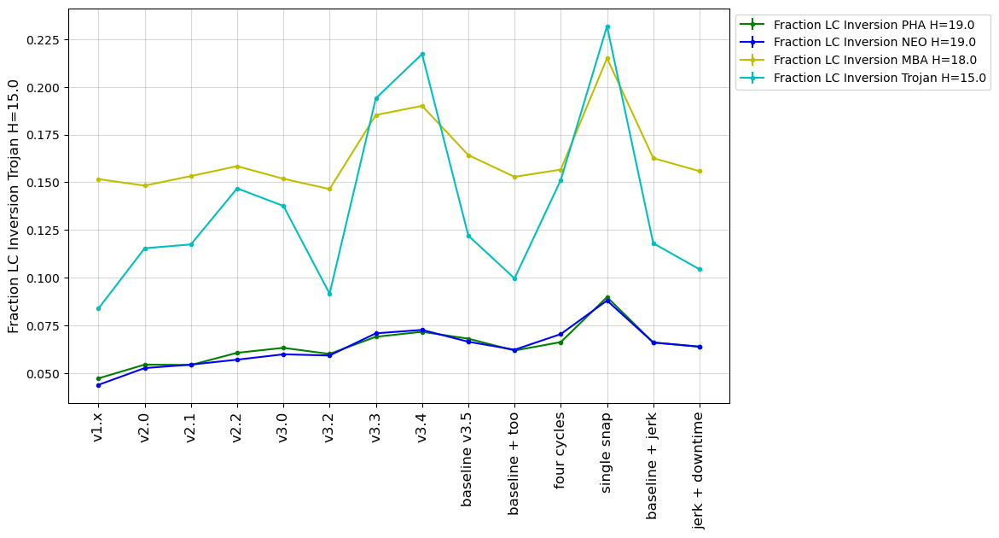

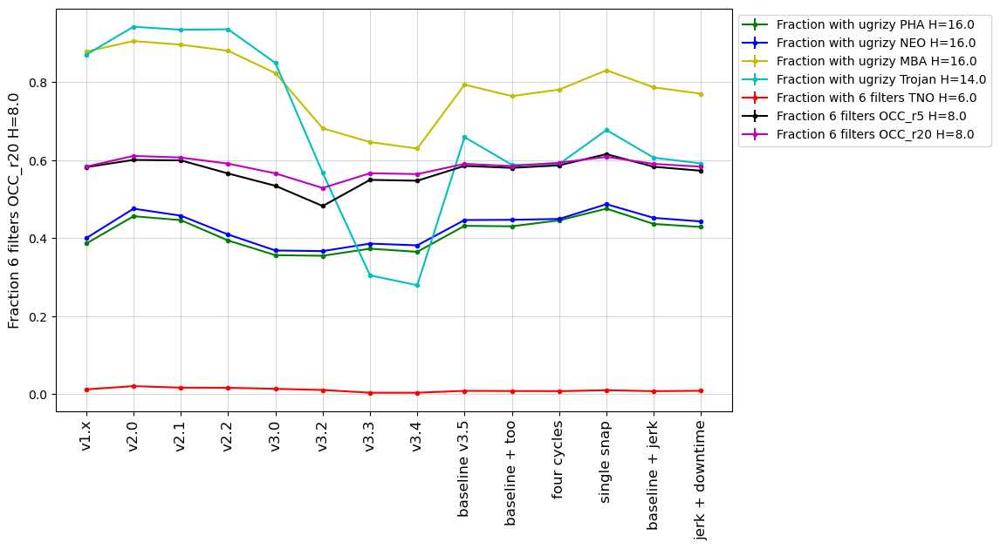

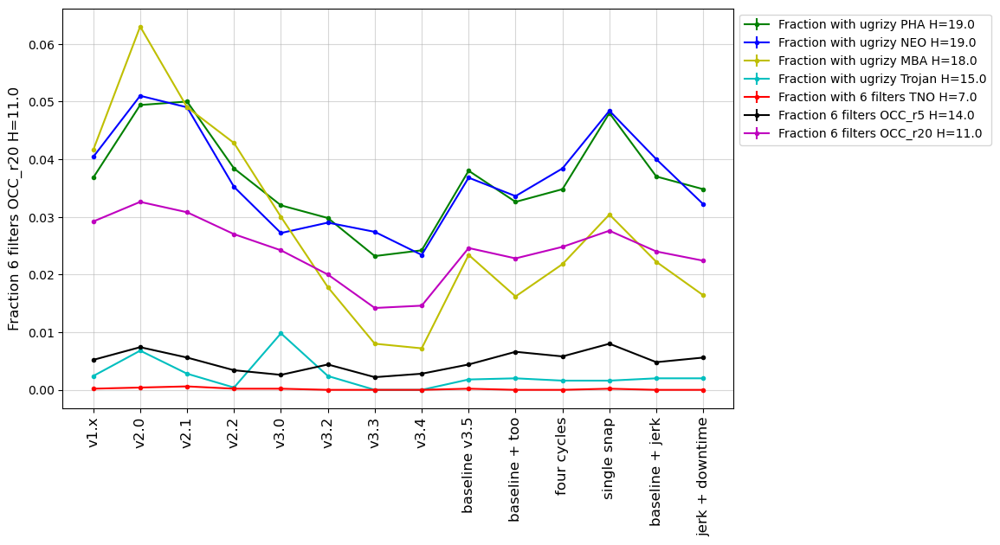

In [114]:
msub = metric_sets.loc['SSO discovery']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

msub = metric_sets.loc['SSO discovery'][::2]

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'completeness_bright' + '.png'), format='png')

msub = metric_sets.loc['SSO discovery'][1::2]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'completeness_faint' + '.png'), format='png')

msub = metric_sets.loc['SSO lightcurve inversion'][1::2]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'lightcurves_faint' + '.png'), format='png')

msub = metric_sets.loc['SSO fraction 6 bands'][::2]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'colors6_bright' + '.png'), format='png')

msub = metric_sets.loc['SSO fraction 6 bands'][1::2]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)
fig.savefig(os.path.join(outdir, 'colors6_faint' + '.png'), format='png')

### AGN
<a id="AGN"></a>
Metrics contributed by the Active Galactic Nuclei science collaboration.

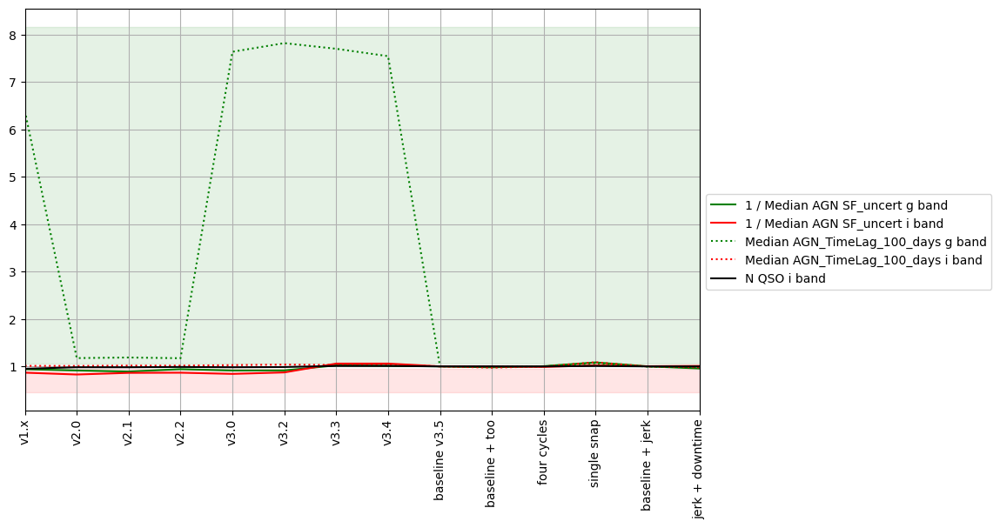

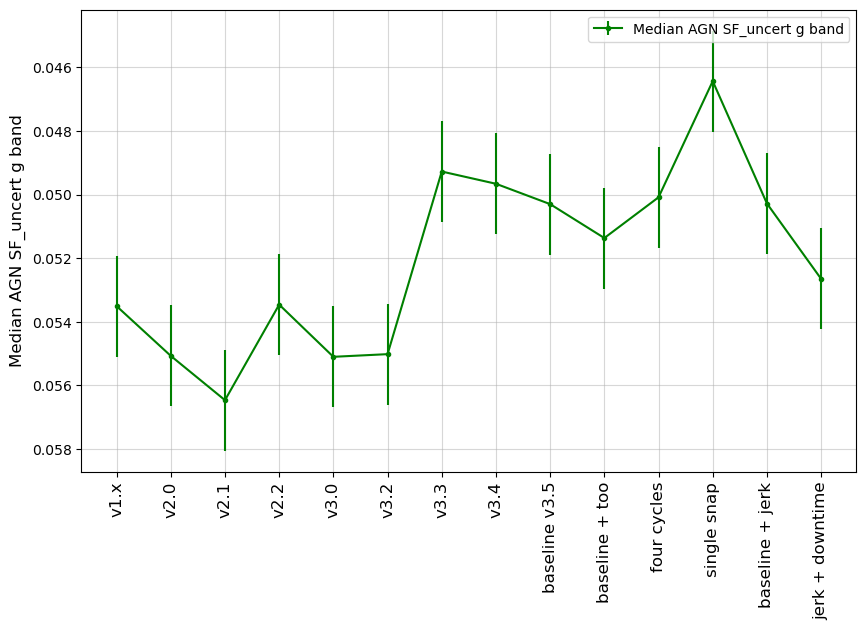

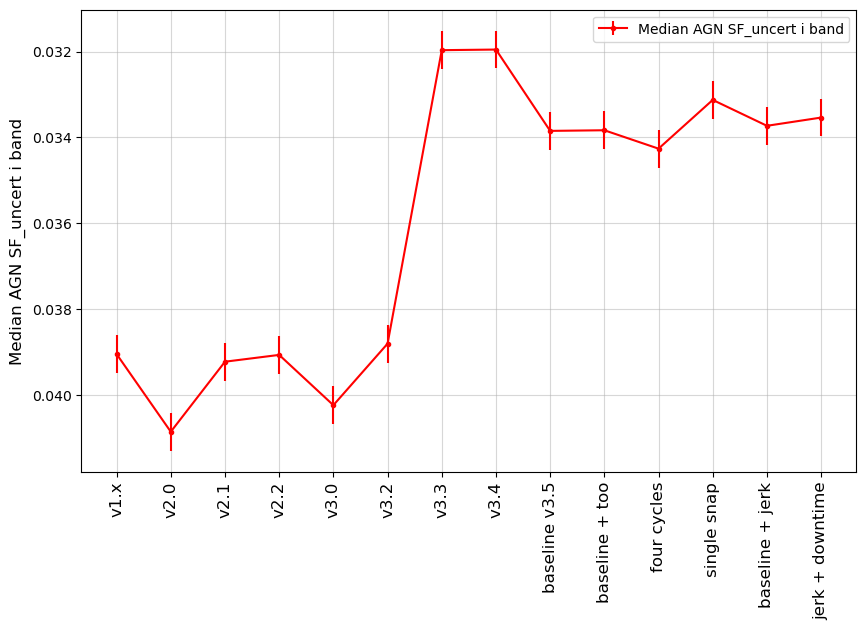

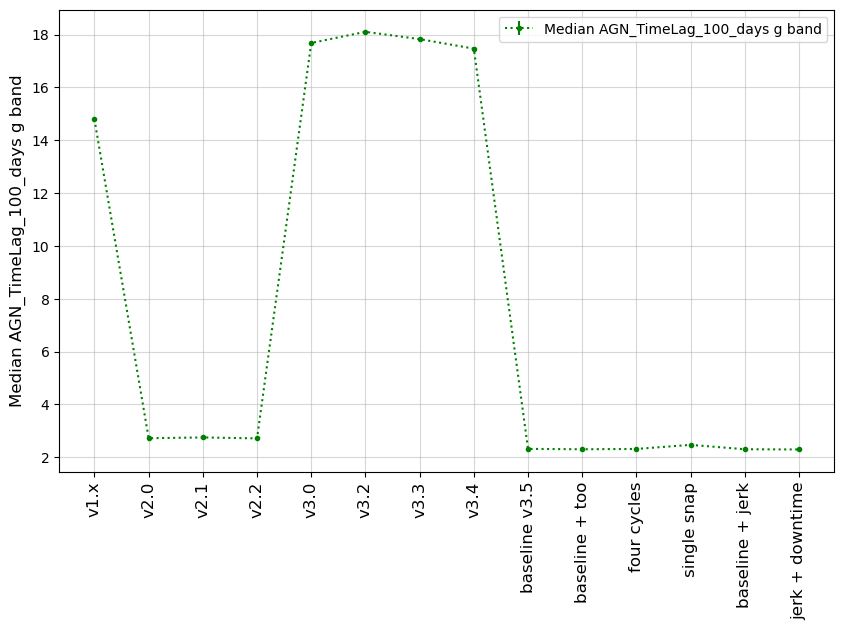

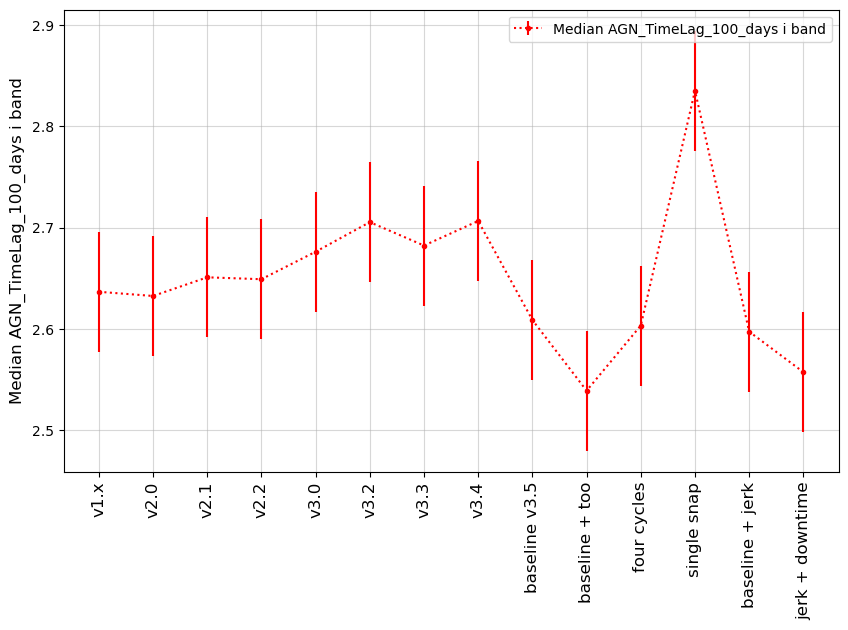

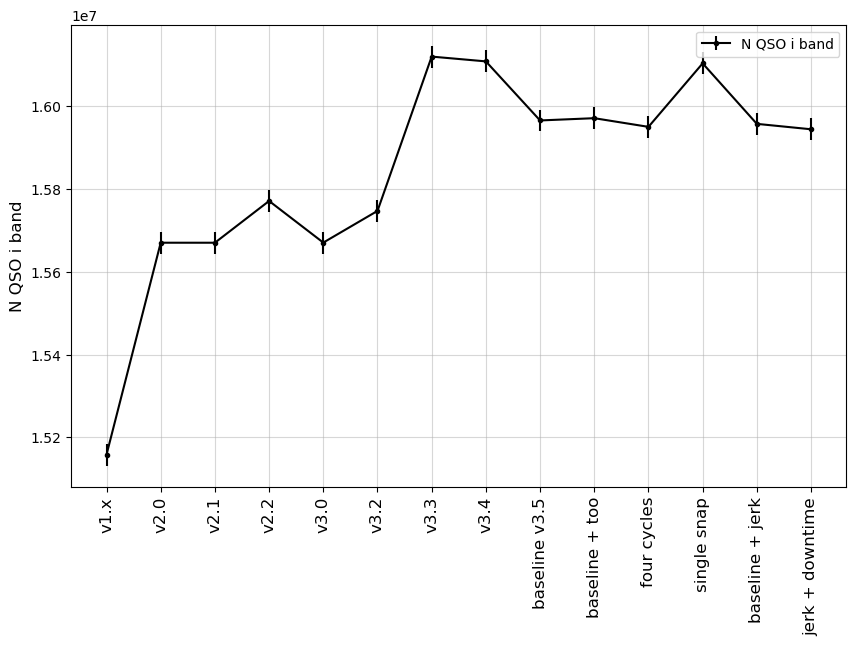

In [115]:
msub = metric_sets.loc['AGN short']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')
ax.legend(loc=(1.01, 0.3))
              
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

### Galaxies
<a id="Galaxies"></a>
Metrics evaluating the total number of galaxies expected in the survey.

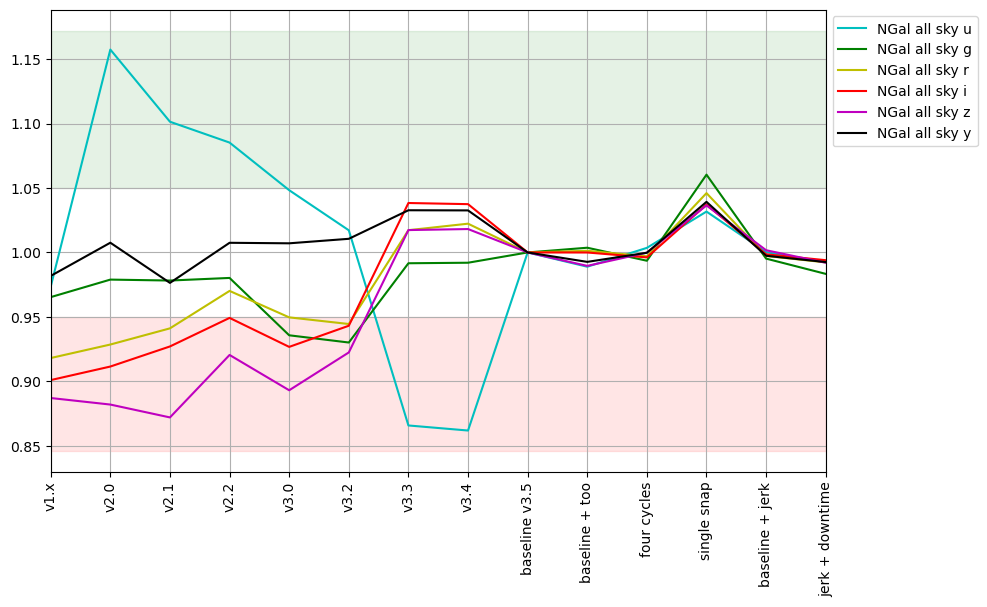

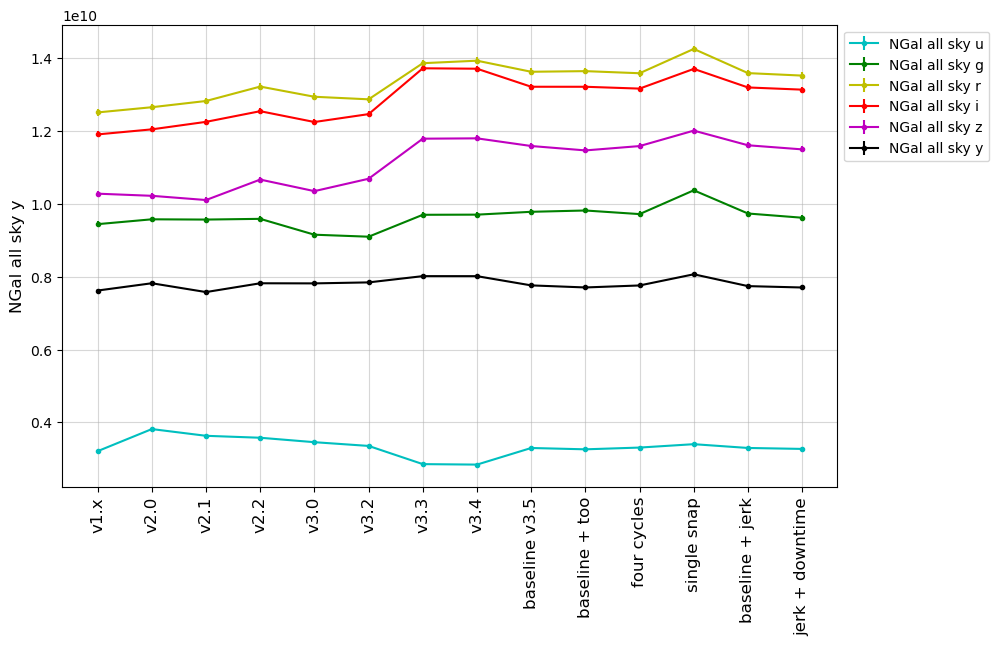

In [116]:
msub = metric_sets.loc['galaxies']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=False)

### Strong Lensing
<a id="StrongLensing"></a>
Metrics contributed by the Strong Lensing Science Collaboration. 

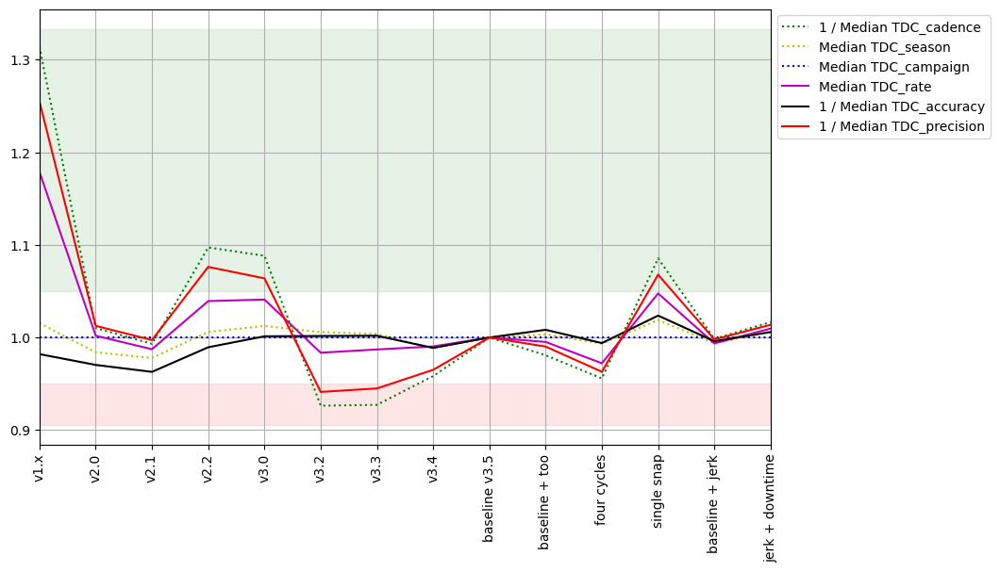

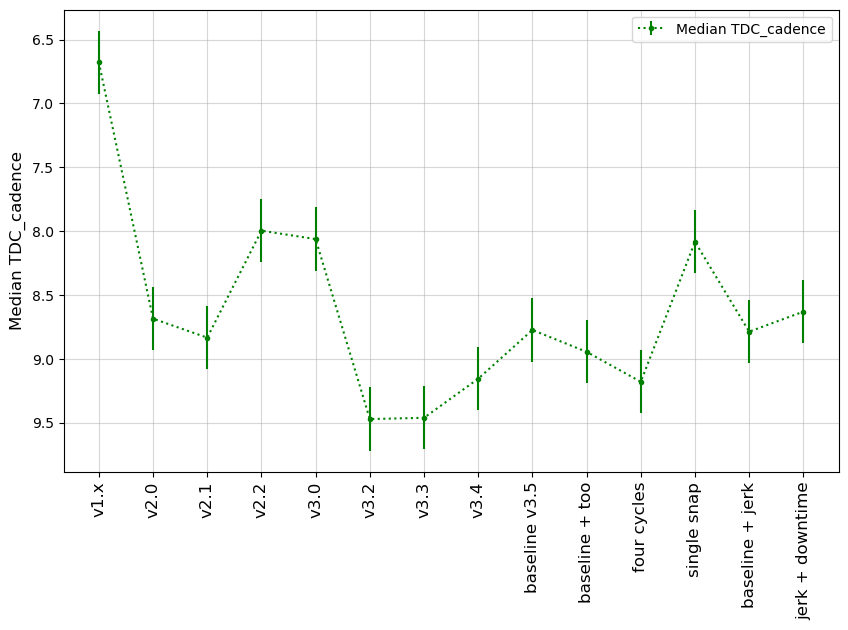

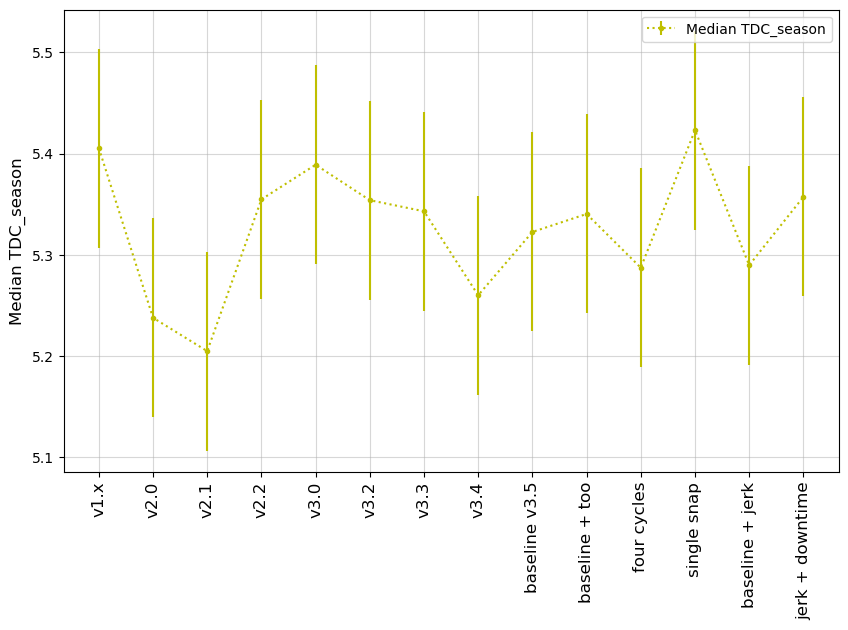

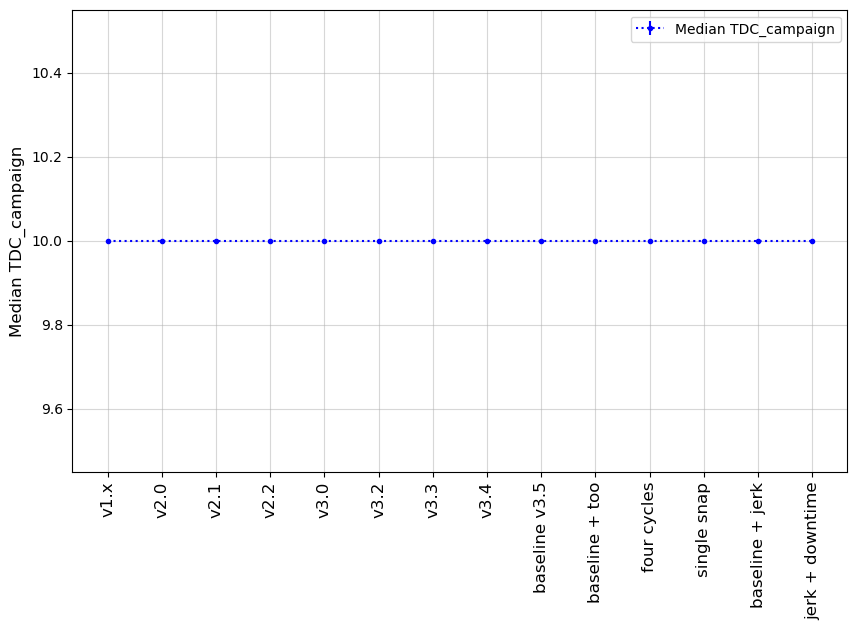

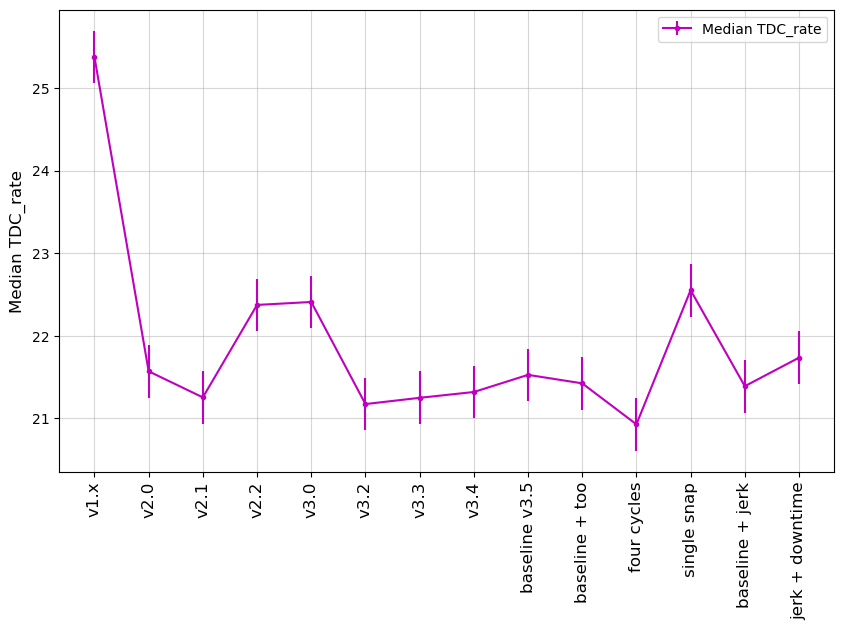

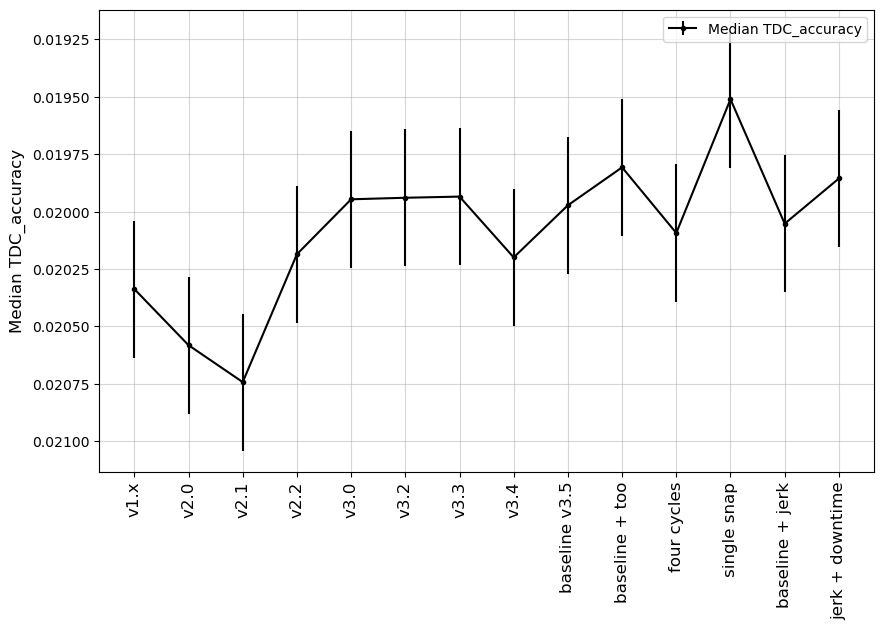

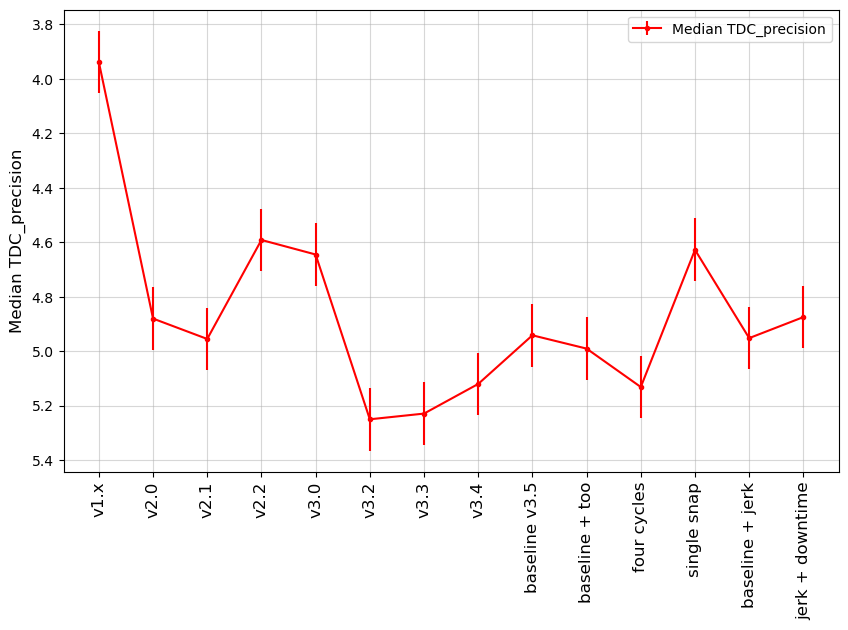

In [117]:
msub = metric_sets.loc['SL TDC']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

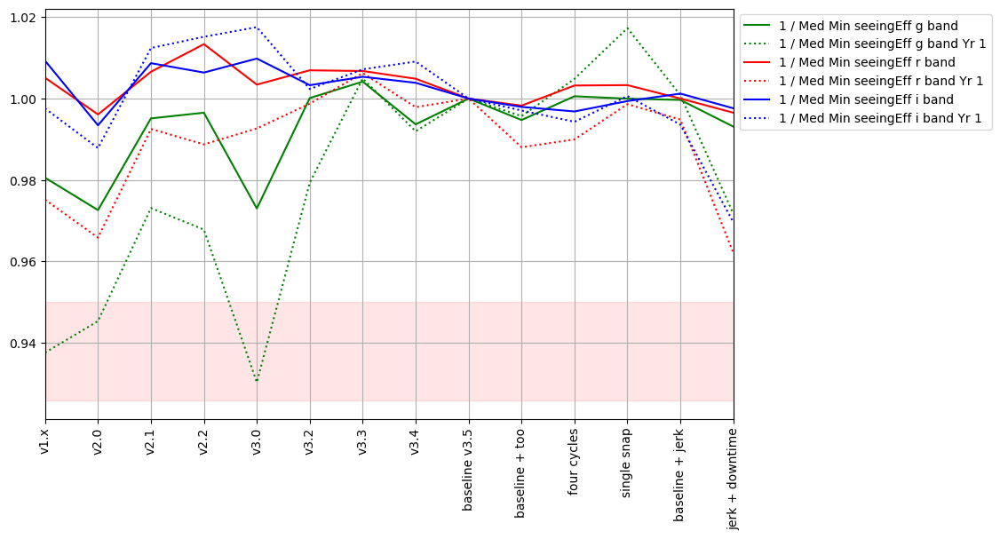

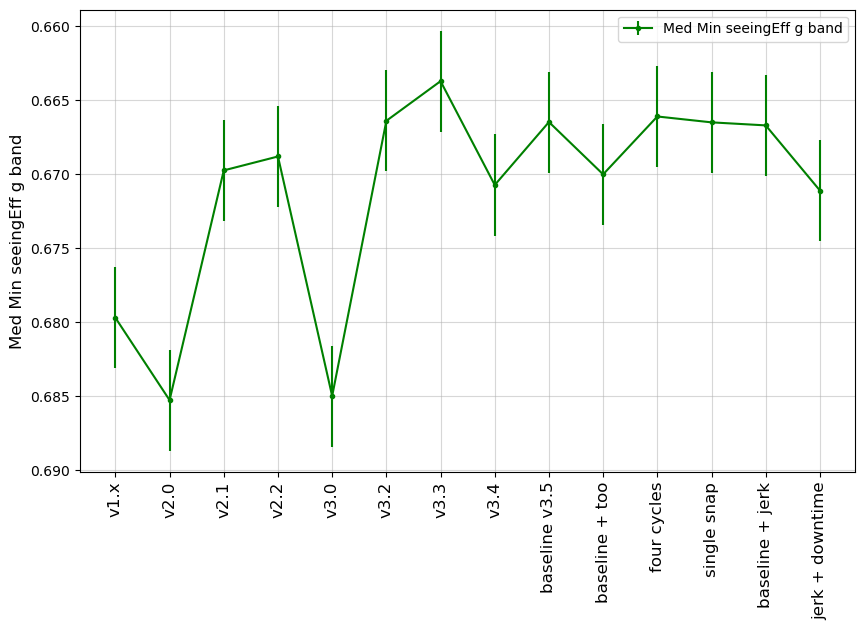

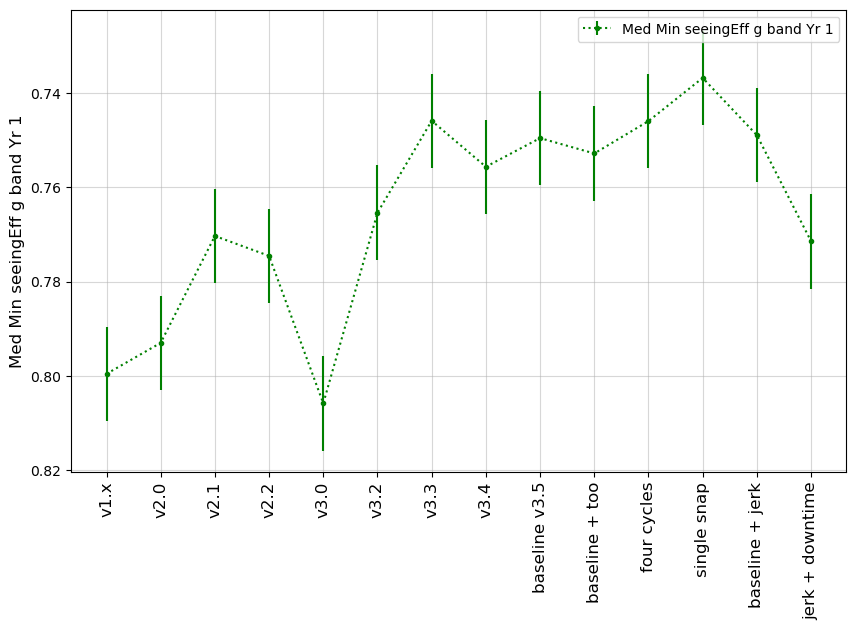

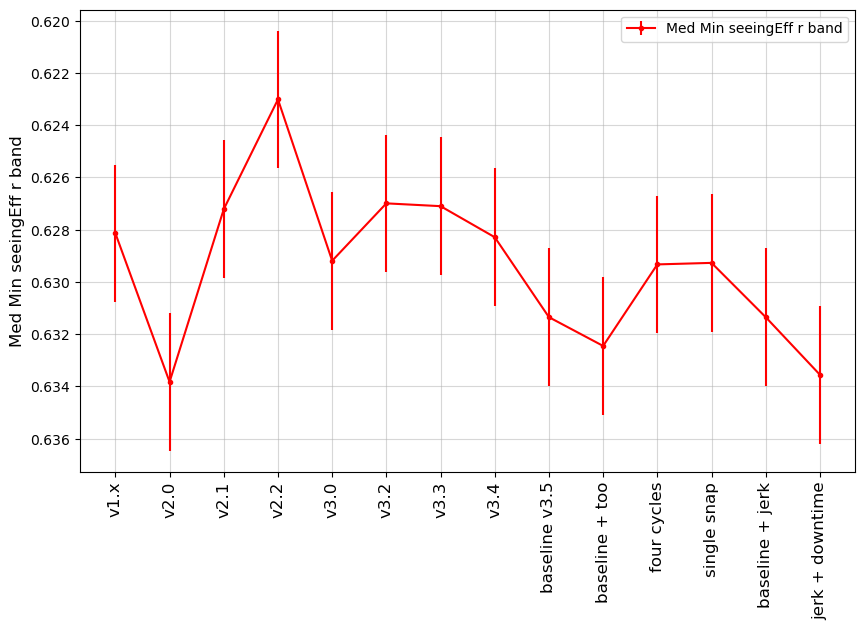

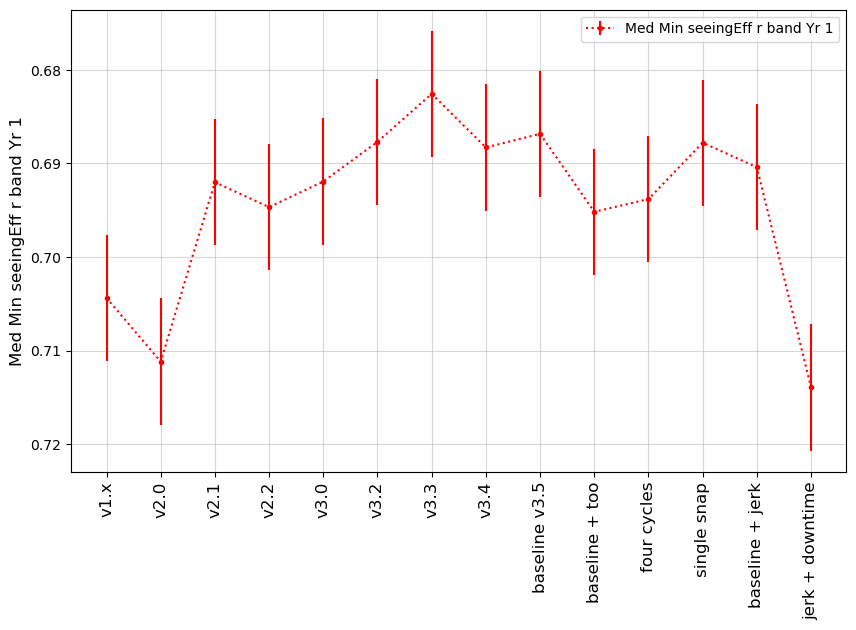

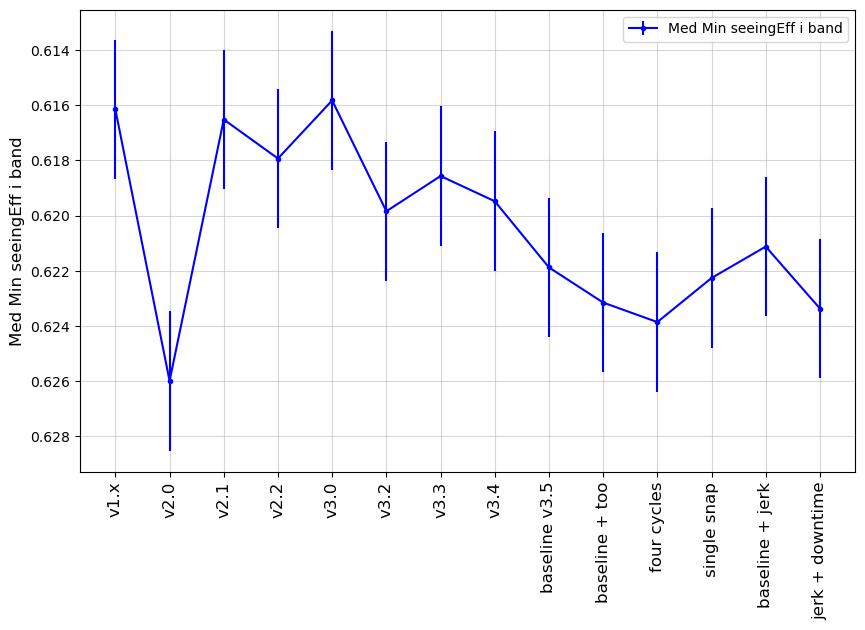

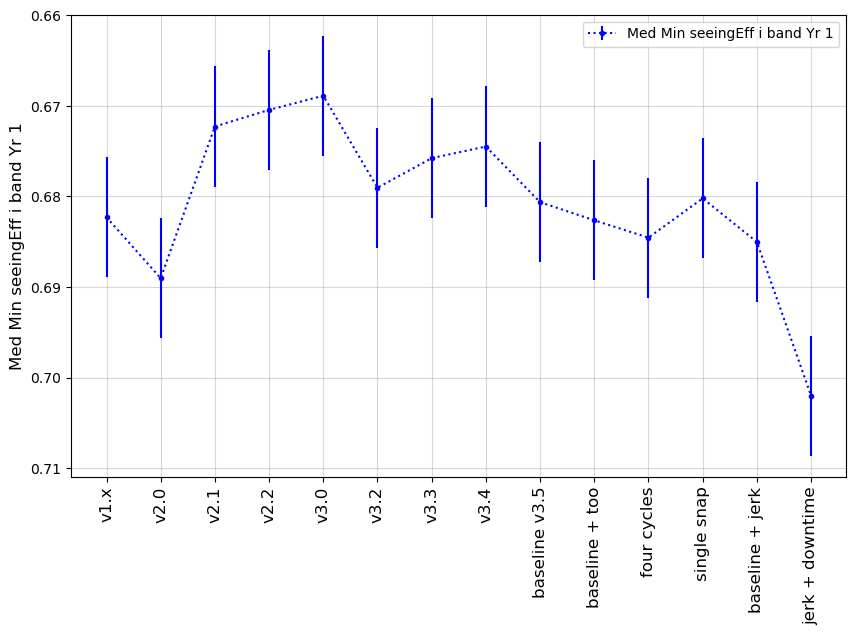

In [118]:
msub = metric_sets.loc['SL IQ']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline,
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

### Stars
<a id="Stars"></a>
Metrics considering total number of stars available in the survey. 

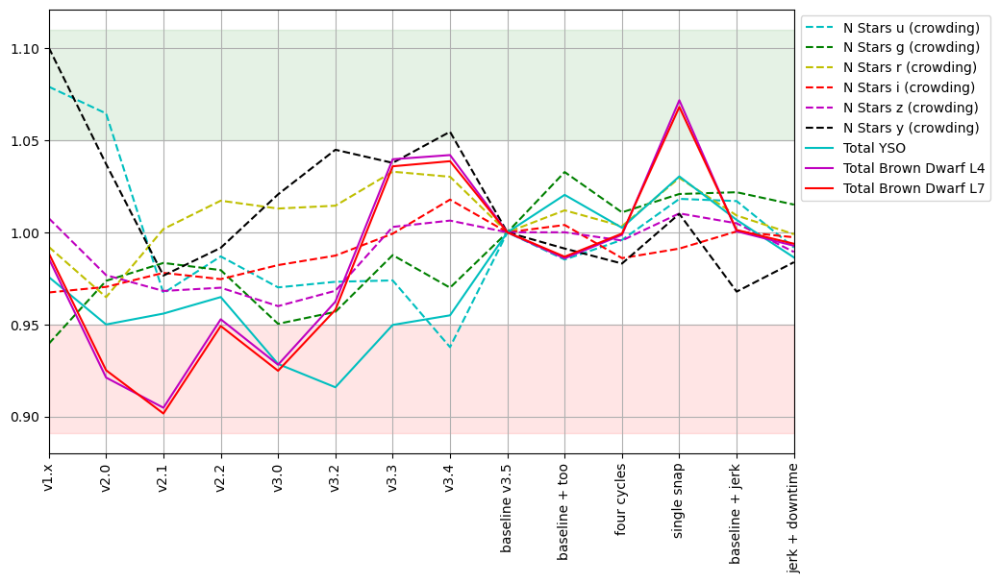

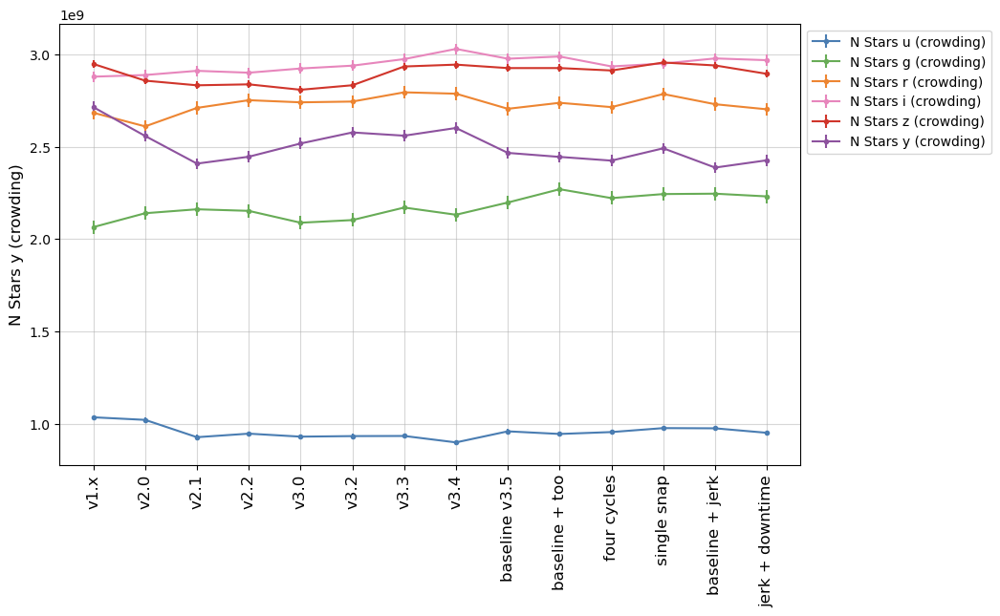

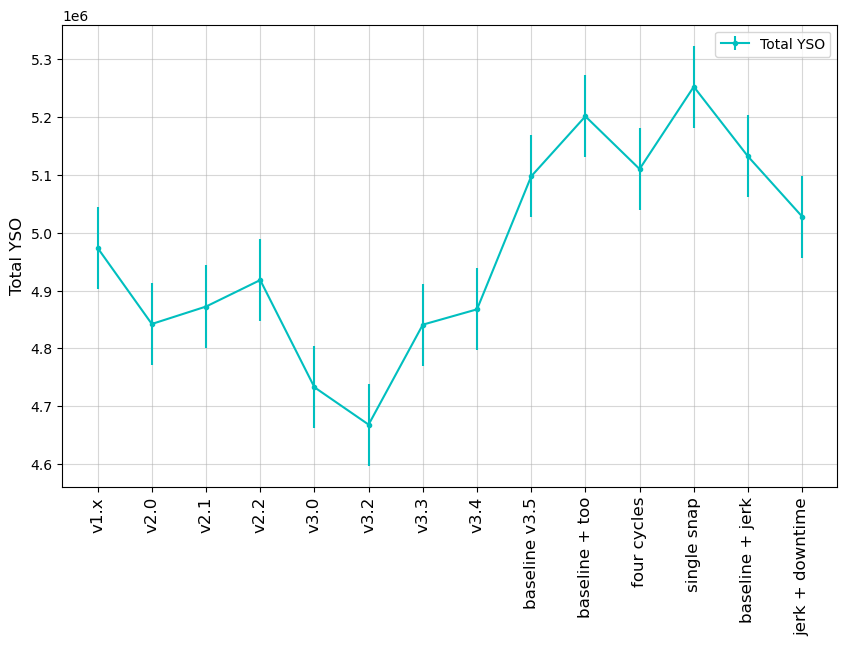

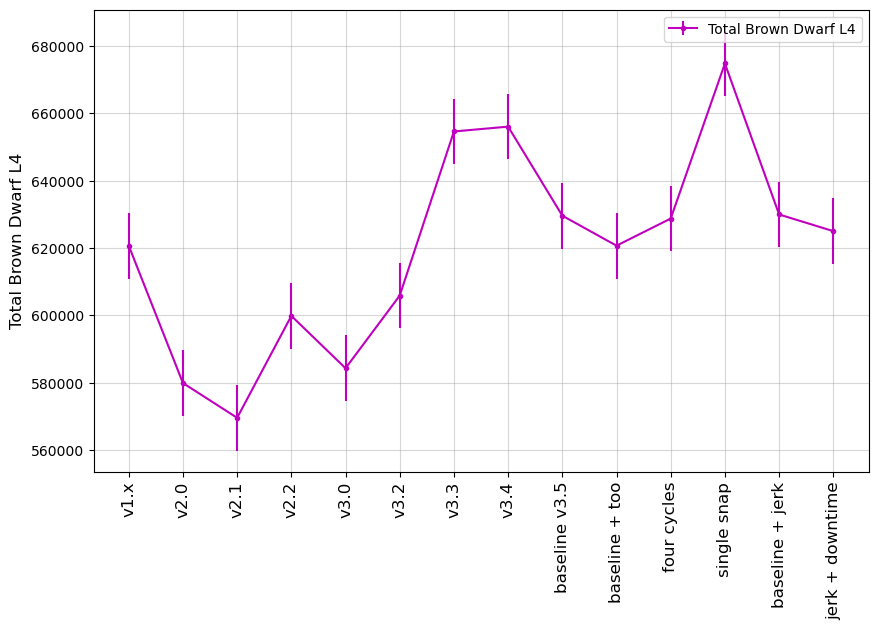

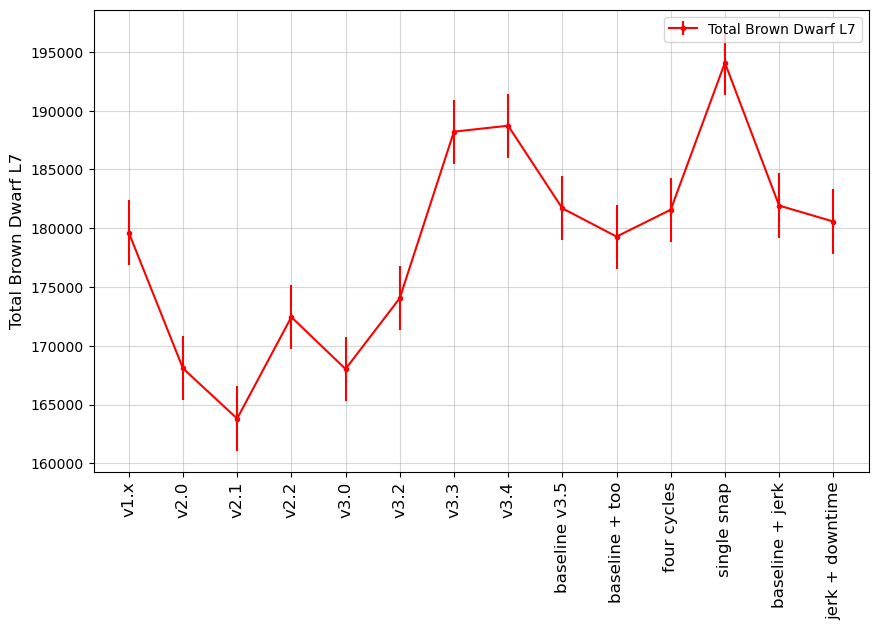

In [119]:
msub = metric_sets.loc['Stars']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

msub = metric_sets.loc['Stars'][0:6]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=filter_color_map,
                                 metric_subset=msub, sep_plots=False)

msub = metric_sets.loc['Stars'][6:]
fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

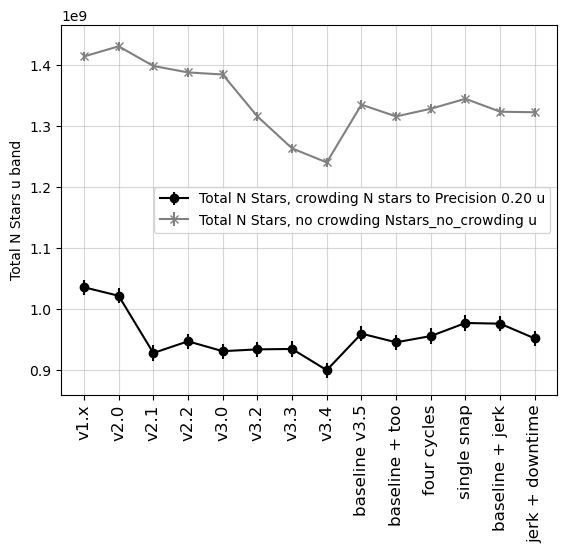

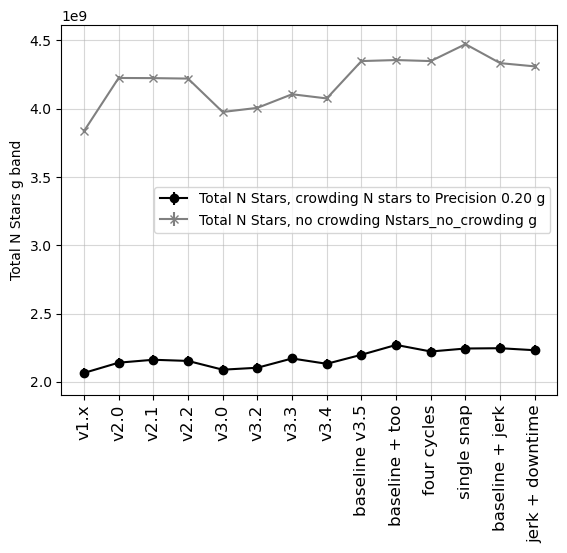

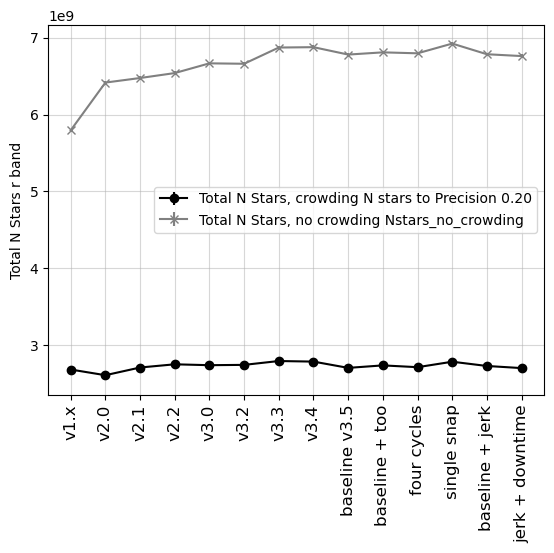

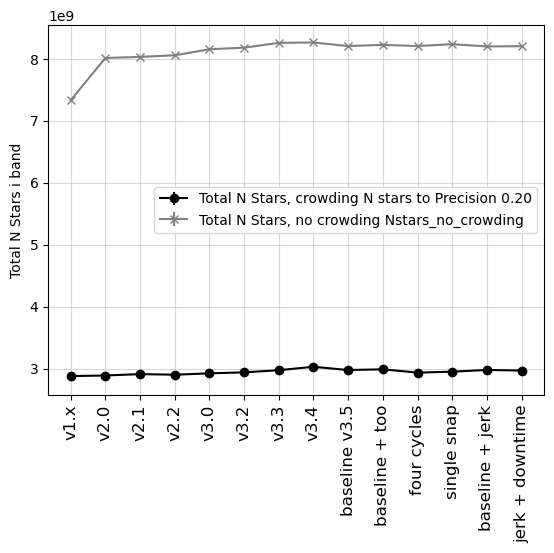

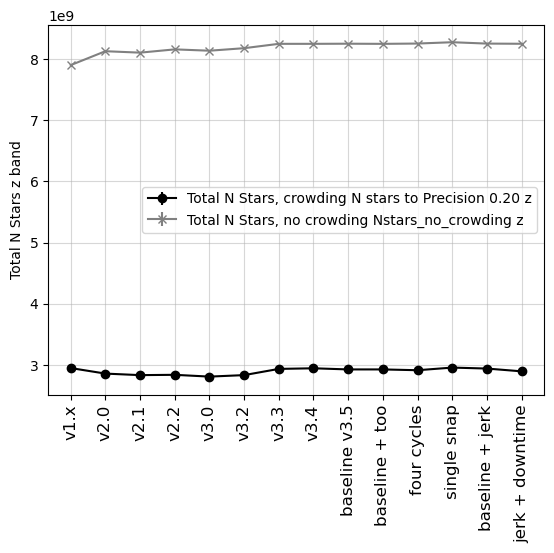

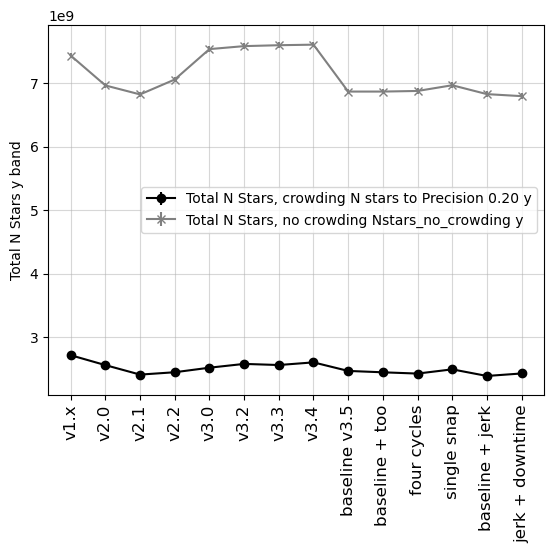

In [120]:
# Note: crowding metric still needs an update to fix a bug noted by the community

for f in 'ugrizy':
    metrics = [m for m in summaries if "Total N Stars" in m and f" {f} " in m]
    fig, ax = plt.subplots()
    for m, marker, color in zip(metrics, ['o', 'x'], ['black', 'gray']):
        ax.errorbar(list(rdict.values()), summaries.loc[runs, m], yerr=dev[m], 
                    color=color, marker=marker, linestyle='-', label=m.rstrip(' HealpixSlicer'))
    ax.legend()
    ax.set_ylabel(f"Total N Stars {f} band")
    ax.tick_params(axis='x', labelrotation = 90, labelsize='large')
    ax.grid(True, alpha=0.5)

### Milky Way & Local Volume 
<a id="MWLV"></a>
Metrics for the local volume and milky way. These metrics tend to have a focus on galactic plane coverage, south celestial pole or SMC & LMC coverage. 


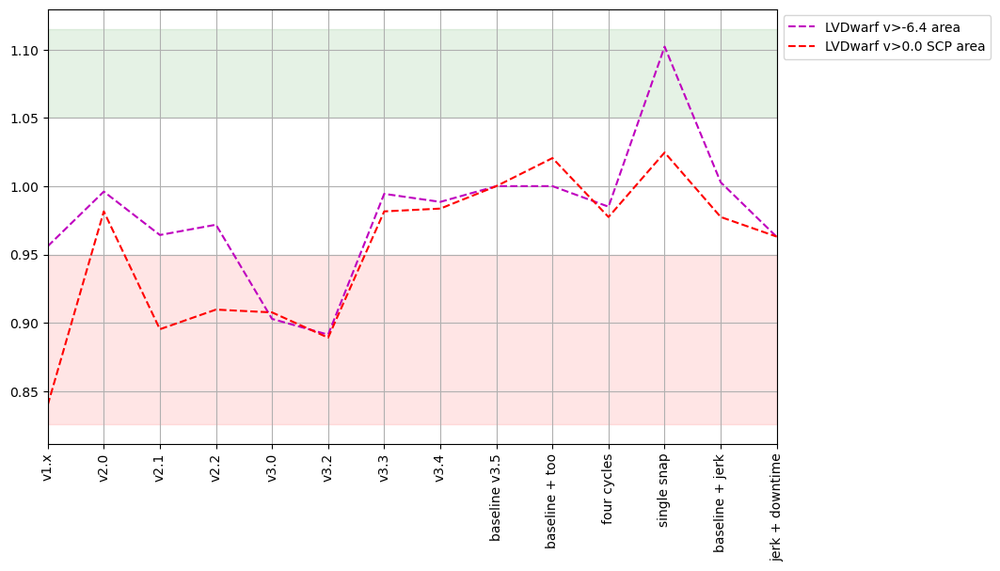

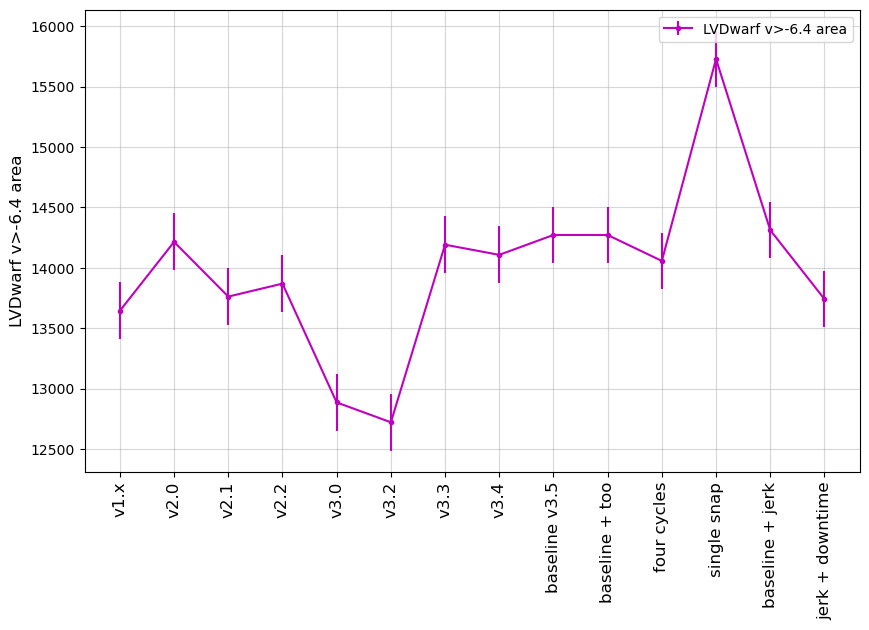

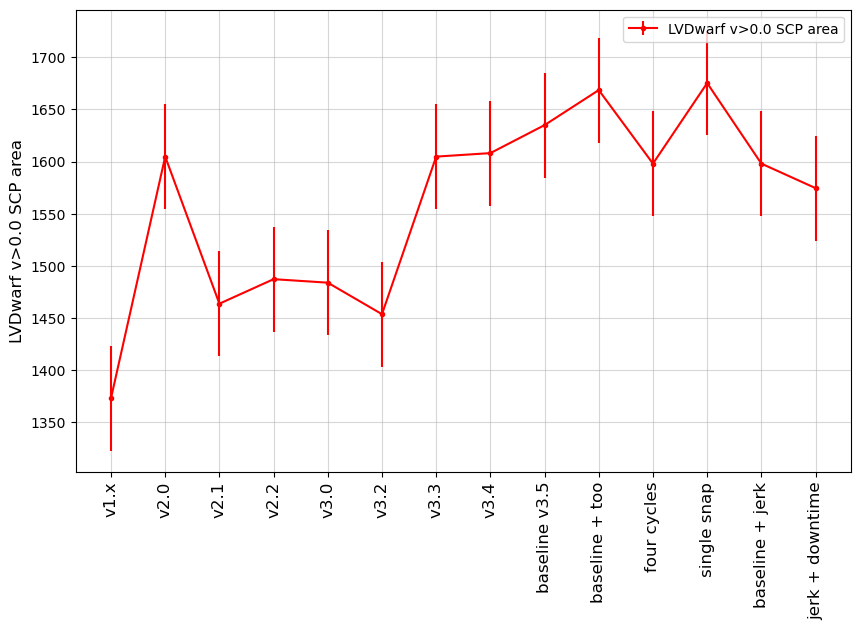

In [121]:
msub = metric_sets.loc['Local Volume']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 metric_subset=msub, sep_plots=True)

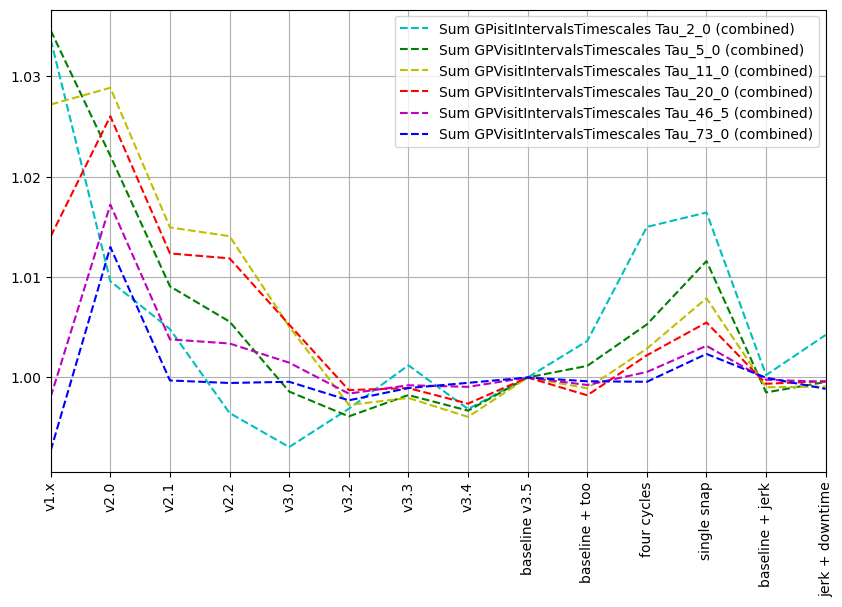

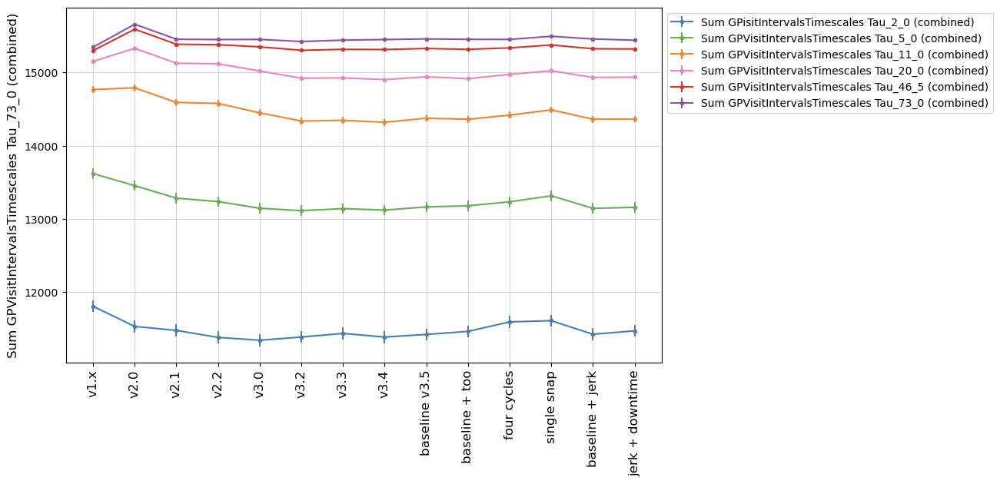

In [122]:
msub = metric_sets.loc['GP visit']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=filter_color_map,
                                 metric_subset=msub, sep_plots=False)

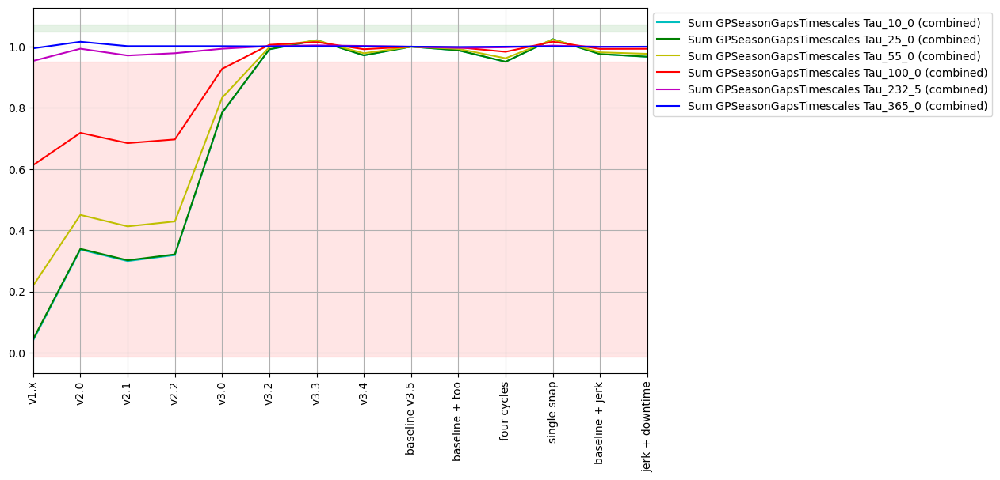

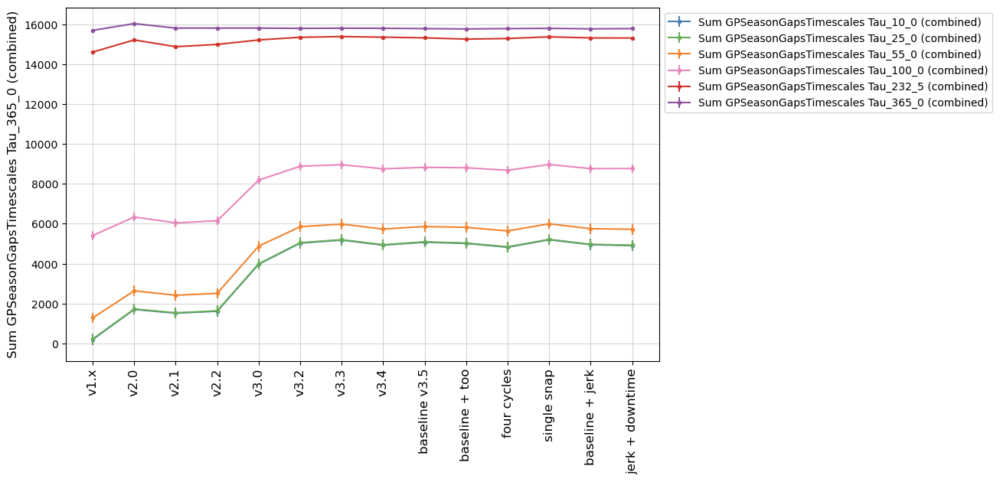

In [123]:
msub = metric_sets.loc['GP season']

fig, ax = maf.plot_run_metric(summaries.loc[runs, msub['metric']], 
                              baseline_run=baseline, 
                              metric_subset=msub,
                              metric_label_map=msub['short_name'],
                              run_label_map=rdict,
                              horizontal_quantity='run',
                              vertical_quantity='value')

fig, ax = maf.plot_run_metric_uncert(summaries.loc[runs, msub['metric']], 
                                 dev[msub['metric']], 
                                 metric_label_map=msub['short_name'], 
                                 run_label_map=rdict,
                                 cmap=filter_color_map,
                                 metric_subset=msub, sep_plots=False)

metric,Identity Number of Exposures UniSlicer,Identity Counts_DD:COSMOS UniSlicer,Identity Counts_DD:ECDFS UniSlicer,Identity Counts_DD:EDFS_a UniSlicer,Identity Counts_DD:EDFS_b UniSlicer,Identity Counts_DD:ELAISS1 UniSlicer,Identity Counts_DD:XMM_LSS UniSlicer
run,,,,,,,
retro_baseline_v2.0_10yrs,2048566.0,18420.0,18983.0,NaN,NaN,18973.0,NaN
baseline_v2.0_10yrs,2086980.0,18707.0,19236.0,NaN,NaN,19356.0,NaN
baseline_v2.1_10yrs,2081749.0,18648.0,19195.0,NaN,NaN,19258.0,NaN
baseline_v2.2_10yrs,2074975.0,20766.0,20555.0,10305.0,10289.0,21126.0,20888.0
baseline_v3.0_10yrs,2086079.0,41243.0,22821.0,11571.0,11555.0,22817.0,22969.0
baseline_v3.2_10yrs,2125578.0,43020.0,22926.0,11702.0,11664.0,22051.0,22668.0
baseline_v3.3_10yrs,2131089.0,40512.0,22254.0,11660.0,11597.0,20857.0,22286.0
baseline_v3.4_10yrs,2146797.0,42240.0,22217.0,11518.0,11483.0,20768.0,22222.0
baseline_v3.5_10yrs,2138598.0,44587.0,24342.0,12361.0,12318.0,23187.0,23865.0


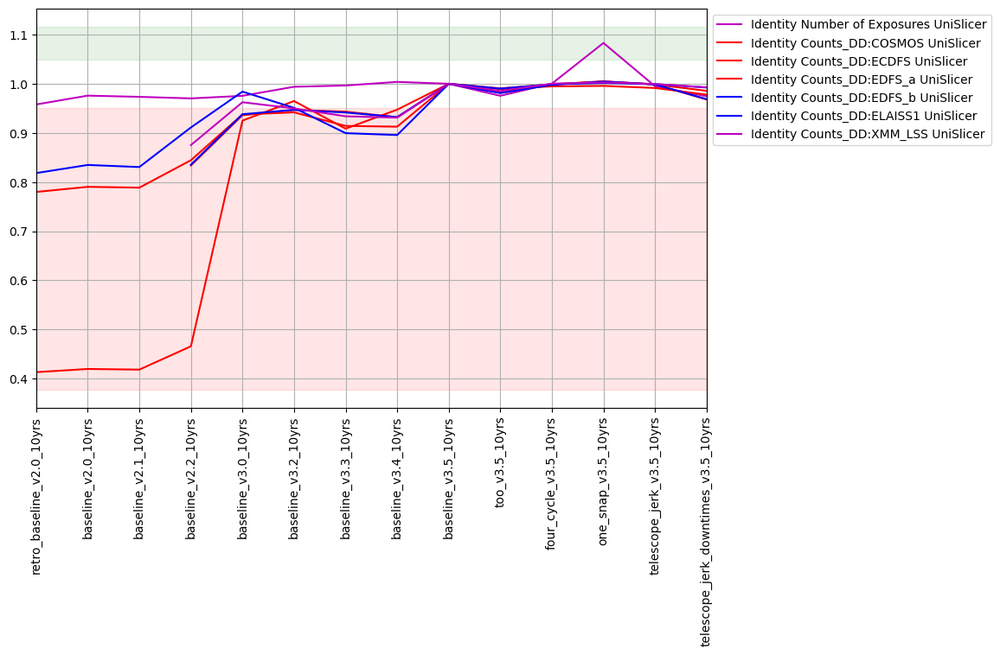

In [124]:
# First let's check the total number of visits in the DDFS, 
# as this has a significant impact on the depths and everything else. 
count_metrics = ['Identity Number of Exposures UniSlicer', 'Identity Counts_DD:COSMOS UniSlicer',
 'Identity Counts_DD:ECDFS UniSlicer',
 #'Identity Counts_DD:EDFS, a UniSlicer',
 #'Identity Counts_DD:EDFS, b UniSlicer',
 'Identity Counts_DD:EDFS_a UniSlicer',
 'Identity Counts_DD:EDFS_b UniSlicer',
 'Identity Counts_DD:ELAISS1 UniSlicer',
 #'Identity Counts_DD:XMM-LSS UniSlicer',
 'Identity Counts_DD:XMM_LSS UniSlicer']

these_runs = runs
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, count_metrics],
                             baseline_run=baseline,
                              linestyles='-',
                              markers=[''],
                             horizontal_quantity='run',
                             vertical_quantity='value',
                             shade_fraction=.05)
#ax.set_ylim(0.3, 1.8)

summaries.loc[these_runs, count_metrics]